# Project Assignment 4 : Image Classification System for Indian Bird Species

## Introduction

The focus of this project is to develop an image classification method for our dataset (Indian bird species) using machine learning and deep learning techniques. The main methods used in this project are feature extraction with classical machine learning classifiers, transfer learning with widely used CNN models and using our own CNN written from scratch. The goal is to evaluate the effectiveness of different approaches for accurately identifying bird species from images and comparing our approaches under different settings to get insights into both traditional and deep learning-based classification pipelines.

## Import Statements

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import copy
import cv2
import random
import shutil
from pathlib import Path
from tqdm import tqdm
import torch
from torch.utils.data import DataLoader
from torch import nn, optim
from torchvision import transforms, models
from torchvision.datasets import ImageFolder
from sklearn.decomposition import PCA
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.metrics import confusion_matrix
from skimage.feature import hog
from sklearn.cluster import KMeans
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import classification_report


## Helper Functions

In [2]:
def display_metrics(class_report):
    summary = {
        "Accuracy": [round(class_report["accuracy"], 4)],
        "Precision": [round(class_report["macro avg"]["precision"], 4)],
        "Recall": [round(class_report["macro avg"]["recall"], 4)],
        "F1-score": [round(class_report["macro avg"]["f1-score"], 4)]
    }

    df = pd.DataFrame(summary)
    print(df.to_string(index=False))

def plot_confusion_matrix(y_true, y_pred, class_names, title="Confusion Matrix"):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=class_names, yticklabels=class_names)
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title(title)
    plt.show()

## Dataset Preprocessing

In this section, a script that splits the valid set into half to generate a test set is run. This way the data is split with %80:%10:%10 (train:valid:test) ratio. 

In [3]:
def split_valid_into_valid_and_test(dataset_path="dataset", split_ratio=0.5, seed=42):
    random.seed(seed)
    valid_path = Path(dataset_path) / "valid"
    test_path = Path(dataset_path) / "test"
    
    # Create test directories
    class_dirs = [d for d in valid_path.iterdir() if d.is_dir()]
    for class_dir in class_dirs:
        class_name = class_dir.name
        test_class_dir = test_path / class_name
        test_class_dir.mkdir(parents=True, exist_ok=True)

        images = list(class_dir.glob("*"))
        random.shuffle(images)
        split_index = int(len(images) * split_ratio)
        test_images = images[:split_index]

        # Move files
        for img_path in test_images:
            shutil.move(str(img_path), str(test_path / class_name / img_path.name))

        print(f"Moved {len(test_images)} images from 'valid/{class_name}' to 'test/{class_name}'")

In [ ]:
# split_valid_into_valid_and_test("dataset")

Moved 150 images from 'valid/Asian-Green-Bee-Eater' to 'test/Asian-Green-Bee-Eater'
Moved 150 images from 'valid/Brown-Headed-Barbet' to 'test/Brown-Headed-Barbet'
Moved 150 images from 'valid/Cattle-Egret' to 'test/Cattle-Egret'
Moved 150 images from 'valid/Common-Kingfisher' to 'test/Common-Kingfisher'
Moved 150 images from 'valid/Common-Myna' to 'test/Common-Myna'
Moved 150 images from 'valid/Common-Rosefinch' to 'test/Common-Rosefinch'
Moved 150 images from 'valid/Common-Tailorbird' to 'test/Common-Tailorbird'
Moved 150 images from 'valid/Coppersmith-Barbet' to 'test/Coppersmith-Barbet'
Moved 150 images from 'valid/Forest-Wagtail' to 'test/Forest-Wagtail'
Moved 150 images from 'valid/Gray-Wagtail' to 'test/Gray-Wagtail'
Moved 150 images from 'valid/Hoopoe' to 'test/Hoopoe'
Moved 150 images from 'valid/House-Crow' to 'test/House-Crow'
Moved 150 images from 'valid/Indian-Grey-Hornbill' to 'test/Indian-Grey-Hornbill'
Moved 150 images from 'valid/Indian-Peacock' to 'test/Indian-Peacock

## Part 1: Classification According to Feature Extraction

In this part, three feature extraction methods (Color Histogram, SIFT, HoG) are used with three machine learning models (SVM, Random Forest, Naive Bayes). Each feature extraction method is explained under its respective title. All of the results are discussed under "Results and Findings" title in Part 1. 

The hyperparameters of the models that run in Part 1 and Part 2 is selected the same for us to be able to make fair comparisons among them. SVM are selected with poly kernel with degree 3 and C=1., Random Forest are selected with 100 trees with no max depth. Naive Bayes had no hyperparameters.

This section also includes a hyperparameter search for SVM with Color Histograms to emphasize the importance of hyperparameter tuning without distrupting the workflow of the assignment. The tuned model is not used in the Part 2 to keep the comparisons fair.

### Train and Evaluation Functions

In [3]:
def train_evaluate_svm(
    X_train, y_train, X_valid, y_valid, class_names,
    kernel='poly', C=1.0, degree=3, gamma='scale', random_state=42
):

    svm_params = {
        'kernel': kernel,
        'C': C,
        'random_state': random_state
    }
    if kernel == 'poly':
        svm_params['degree'] = degree
    elif kernel == 'rbf':
        svm_params['gamma'] = gamma

    svm = SVC(**svm_params)
    svm.fit(X_train, y_train)
    preds = svm.predict(X_valid)
    report = classification_report(y_valid, preds, target_names=class_names, zero_division=0, output_dict=True)
    return preds, report

def train_evaluate_rf(
    X_train, y_train, X_valid, y_valid, class_names, 
    n_estimators=100, max_depth=None, random_state=42
):
    rf = RandomForestClassifier(n_estimators=n_estimators, max_depth=max_depth, n_jobs=-1, random_state=random_state)
    rf.fit(X_train, y_train)
    preds = rf.predict(X_valid)
    report = classification_report(y_valid, preds, target_names=class_names, zero_division=0, output_dict=True)
    return preds, report

def train_evaluate_nb(
    X_train, y_train, X_valid, y_valid, class_names
):
    nb = GaussianNB()
    nb.fit(X_train, y_train)
    preds = nb.predict(X_valid)
    report = classification_report(y_valid, preds, target_names=class_names, zero_division=0, output_dict=True)
    return preds, report

### Dataset Preparation

Due to hardware limitations, we decided to resize the images to 256x256 (the biggest size feasible to use in our personal computers) and load it when it is necessary to extract features from them. The reason for that is the images are still too big to keep in RAM but if we load it, extracted the feature and get rid of, then we were barely be able to extract all the features. It made the process longer but it allowed us to use bigger images, which in the end lead to better results.

In [4]:
# Check for GPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

# === Paths ===
dataset_root = Path("dataset")

# === Transform: Resize===
resize_transform = transforms.Compose([
    transforms.Resize((256, 256)),
])

# === Load datasets with ImageFolder ===
train_dataset = ImageFolder(dataset_root / "train", transform=resize_transform)
valid_dataset = ImageFolder(dataset_root / "valid", transform=resize_transform)
test_dataset = ImageFolder(dataset_root / "test", transform=resize_transform)

print(f"Train samples: {len(train_dataset)}")
print(f"Validation samples: {len(valid_dataset)}")
print(f"Test samples: {len(test_dataset)}")
class_names = train_dataset.classes
print(f"Classes: {class_names}")

Using device: cuda
Train samples: 30000
Validation samples: 3750
Test samples: 3750
Classes: ['Asian-Green-Bee-Eater', 'Brown-Headed-Barbet', 'Cattle-Egret', 'Common-Kingfisher', 'Common-Myna', 'Common-Rosefinch', 'Common-Tailorbird', 'Coppersmith-Barbet', 'Forest-Wagtail', 'Gray-Wagtail', 'Hoopoe', 'House-Crow', 'Indian-Grey-Hornbill', 'Indian-Peacock', 'Indian-Pitta', 'Indian-Roller', 'Jungle-Babbler', 'Northern-Lapwing', 'Red-Wattled-Lapwing', 'Ruddy-Shelduck', 'Rufous-Treepie', 'Sarus-Crane', 'White-Breasted-Kingfisher', 'White-Breasted-Waterhen', 'White-Wagtail']


### Data Visualization

In this section, some sample images and distribution of classes are given for the better understanding of data.

In [7]:
def show_sample_images(dataset, class_names, n_rows=3, n_cols=6):
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 8))
    indices = np.random.choice(len(dataset), n_rows * n_cols, replace=False)
    for ax, idx in zip(axes.flatten(), indices):
        img, label = dataset[idx]
        if isinstance(img, torch.Tensor):
            img = img.permute(1, 2, 0).numpy()
            img = (img * 0.5) + 0.5
            img = np.clip(img, 0, 1)
        ax.imshow(img)
        ax.set_title(class_names[label], fontsize=8)
        ax.axis('off')
    plt.tight_layout()
    plt.show()

def plot_class_distribution_from_folder(dataset_path, class_names, title="Class Distribution"):
    class_counts = []
    for class_name in class_names:
        class_dir = os.path.join(dataset_path, class_name)
        count = len([f for f in os.listdir(class_dir) if os.path.isfile(os.path.join(class_dir, f))])
        class_counts.append(count)
    plt.figure(figsize=(12, 4))
    plt.bar(class_names, class_counts)
    plt.xticks(rotation=90)
    plt.xlabel("Class")
    plt.ylabel("Count")
    plt.title(title)
    plt.tight_layout()
    plt.show()

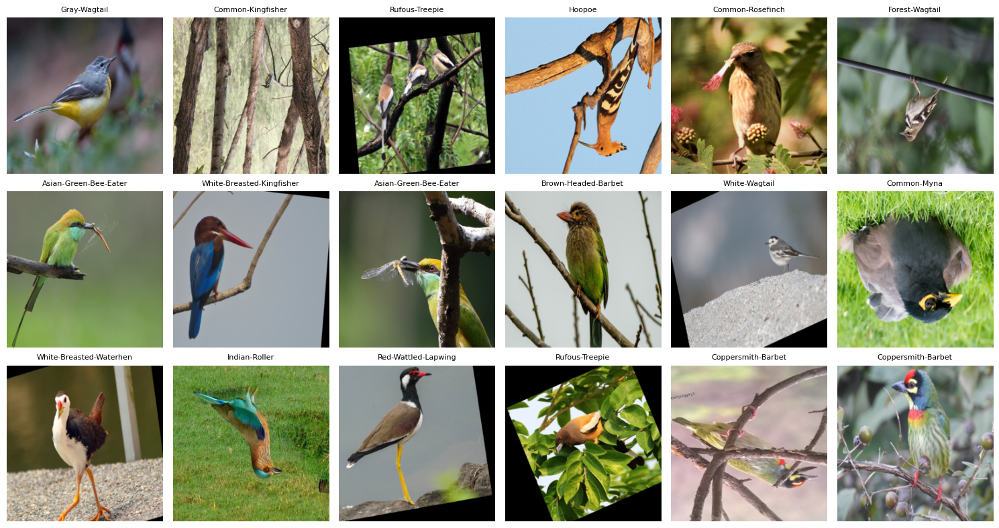

In [6]:
show_sample_images(train_dataset, class_names)

This section is for confirmation. As you can see, each class have same number of training, validation and test images.

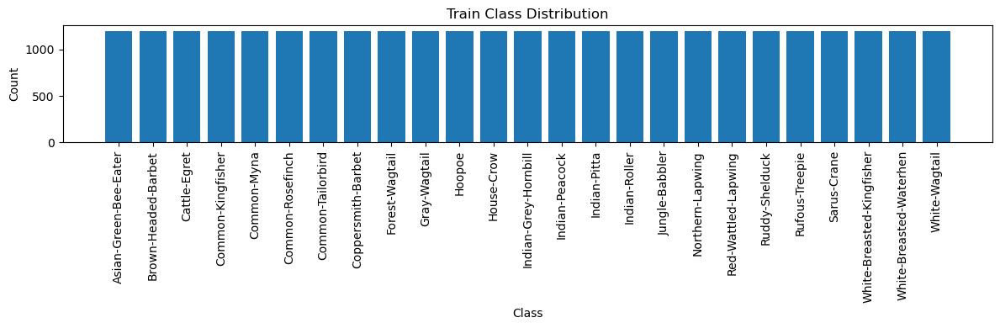

In [ ]:
plot_class_distribution_from_folder("dataset/train", class_names, title="Train Class Distribution")

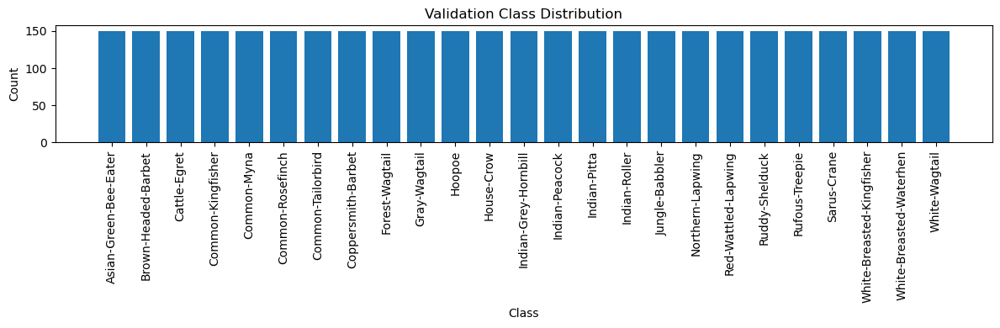

In [9]:
plot_class_distribution_from_folder("dataset/valid", class_names, title="Validation Class Distribution")

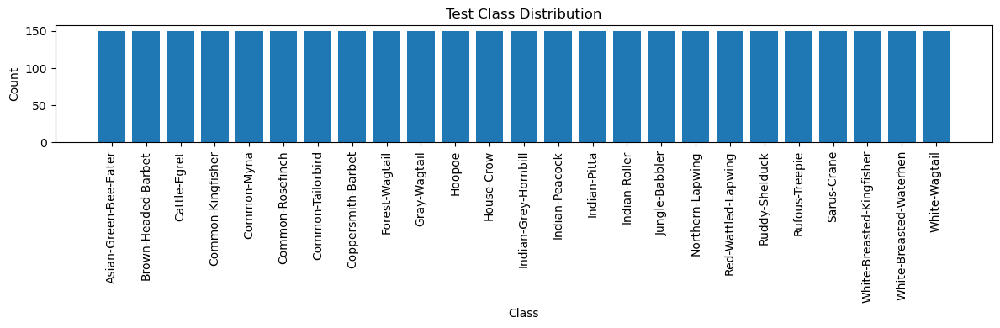

In [10]:
plot_class_distribution_from_folder("dataset/test", class_names, title="Test Class Distribution")

### Color Histogram

The Color Histogram method extracts features by calculating the color distribution of the images. Each pixel value is put into a different bin (8 for each channel for our case) and by counting all of them, we would end up with a color histogram. Our extraction function also normalizes the histograms for fair comparison between our models since some could be effected by unnormalized features. This approach captures the overall color composition of the images, which can be useful for distinguishing between different bird species. The performance of this method with different classifiers will be compared and discussed in the Results and Findings section.

In [6]:
def extract_color_histograms(dataset, bins=(8, 8, 8)):
    features = []
    labels = []
    for img_pil, label in tqdm(dataset, desc="Extracting Color Histograms"):
        img = np.array(img_pil)
        if len(img.shape) == 2:  # grayscale, convert to 3 channels
            print("Image is grayscale, converting to RGB")
            img = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)
        hist = cv2.calcHist([img], [0, 1, 2], None, bins,
                            [0, 256, 0, 256, 0, 256])
        hist = cv2.normalize(hist, hist).flatten()
        features.append(hist)
        labels.append(label)
    return np.array(features), np.array(labels)

In [7]:
# Extract features
train_color_hist, train_labels = extract_color_histograms(train_dataset)
valid_color_hist, valid_labels = extract_color_histograms(valid_dataset)

Extracting Color Histograms: 100%|██████████| 3750/3750 [00:58<00:00, 64.53it/s]


Having 8 bins in each color channel resulted in 8\*8\*8=512 features.

In [23]:
# Print Feature shapes
print(f"Train Color Histogram Features Shape: {train_color_hist.shape}")
print(f"Validation Color Histogram Features Shape: {valid_color_hist.shape}")

Train Color Histogram Features Shape: (30000, 512)
Validation Color Histogram Features Shape: (3750, 512)


In [40]:
# SVM

svm_color_hist_preds, svm_color_hist_report = train_evaluate_svm(
    train_color_hist, train_labels, valid_color_hist, valid_labels, class_names,
    kernel='poly', C=1.0, degree=3, random_state=42
)


SVM (Color Histogram) - Metrics:

 Accuracy  Precision  Recall  F1-score
   0.4256     0.4335  0.4256    0.4252


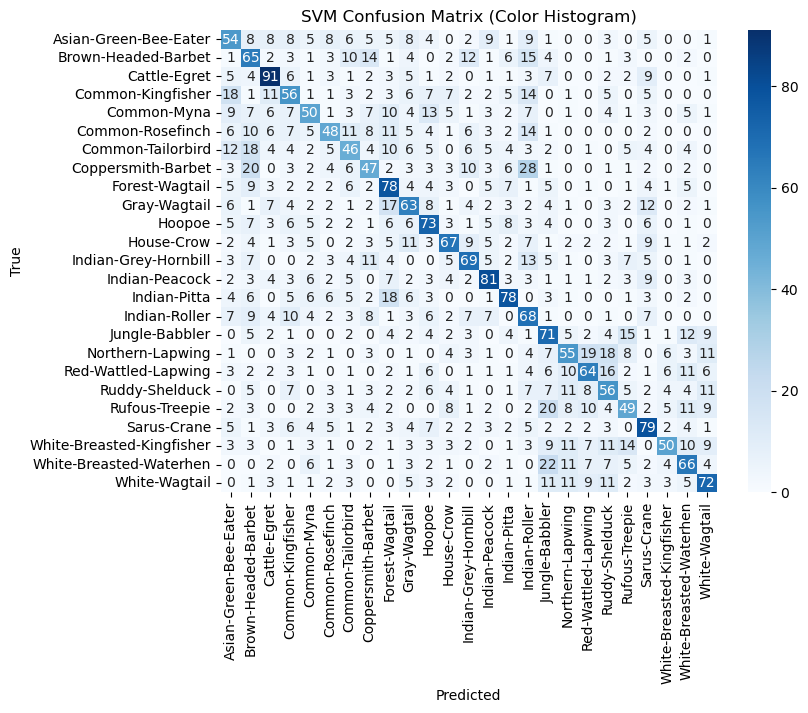

In [41]:
print("SVM (Color Histogram) - Metrics:\n")

display_metrics(svm_color_hist_report)

plot_confusion_matrix(valid_labels, svm_color_hist_preds, class_names, title="SVM Confusion Matrix (Color Histogram)")

In [36]:
# Random Forest

rf_color_hist_preds, rf_color_hist_report = train_evaluate_rf(
    train_color_hist, train_labels, valid_color_hist, valid_labels, class_names
)


Random Forest (Color Histogram) - Metrics:

 Accuracy  Precision  Recall  F1-score
   0.8901     0.8916  0.8901    0.8898


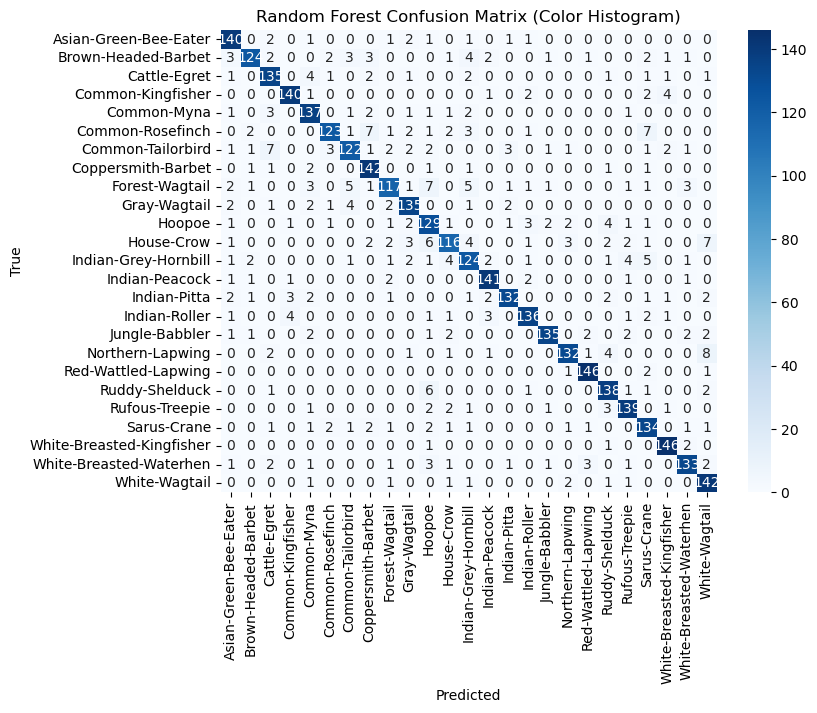

In [38]:
print("Random Forest (Color Histogram) - Metrics:\n")

display_metrics(rf_color_hist_report)

plot_confusion_matrix(valid_labels, rf_color_hist_preds, class_names, title="Random Forest Confusion Matrix (Color Histogram)")

In [42]:
# Naive Bayes

nb_color_hist_preds, nb_color_hist_report = train_evaluate_nb(
    train_color_hist, train_labels, valid_color_hist, valid_labels, class_names
)


In [ ]:
print("Naive Bayes (Color Histogram) - Metrics:\n")

display_metrics(nb_color_hist_report)

plot_confusion_matrix(valid_labels, nb_color_hist_preds, class_names, title="Naive Bayes Confusion Matrix (Color Histogram)")

### SIFT + BoW 

The SIFT (Scale-Invariant Feature Transform) + Bag of Words (BoW) approach starts by first getting local keypoint descriptors from each image using the SIFT algorithm after converting the image to grayscale. SIFT captures distinct patterns and textures and it is robust to scale and rotation. Then by using all the SIFT descriptors from the training set, a visual codebook is built by applying k-means clustering to them. Here, each cluster center represents a visual word. The last step is to construct a histogram of visual words for each image by using the visual codebook. The descriptors from SIFT are used for binning the closest visual word and by counting all of them SIFT histograms are generated for each image. These histograms are then normalized for fair comparison between models. The effectiveness of this approach with different classifiers will be compared and discussed in the Results and Findings section.

In [11]:
# === SIFT Extraction ===
def extract_sift_descriptors(dataset, limit=100):
    sift = cv2.SIFT_create()
    all_descriptors = []
    descriptors_per_image = []
    labels = []

    for img_pil, label in tqdm(dataset, desc="Extracting SIFT"):
        img = np.array(img_pil)
        if len(img.shape) == 3:
            img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        keypoints, descriptors = sift.detectAndCompute(img, None)
        if descriptors is not None:
            descriptors = descriptors[:limit]
            all_descriptors.append(descriptors)
            descriptors_per_image.append(descriptors)
        else:
            descriptors_per_image.append(None)
        labels.append(label)
    return all_descriptors, descriptors_per_image, labels

# === BoVW Model ===
def fit_kmeans(all_desc, n_clusters):
    stacked_desc = np.vstack([desc for desc in all_desc if desc is not None])
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    kmeans.fit(stacked_desc)
    return kmeans

# === Histogram Construction ===
def build_histograms(kmeans, descriptors_list, n_clusters):
    histograms = []
    for descriptors in descriptors_list:
        hist = np.zeros(n_clusters)
        if descriptors is not None:
            cluster_result = kmeans.predict(descriptors)
            for idx in cluster_result:
                hist[idx] += 1
        hist = cv2.normalize(hist, None).flatten()
        histograms.append(hist)
    return np.array(histograms)

In [12]:
all_train_desc, train_desc_per_img, train_labels = extract_sift_descriptors(train_dataset)
_, valid_desc_per_img, valid_labels = extract_sift_descriptors(valid_dataset)

Extracting SIFT: 100%|██████████| 3750/3750 [01:39<00:00, 37.70it/s]


In [13]:
kmeans = fit_kmeans(all_train_desc, 200)

train_sift_hist = build_histograms(kmeans, train_desc_per_img, 200)
valid_sift_hist = build_histograms(kmeans, valid_desc_per_img, 200)

Since we clustered with 200 center points, our features have the size 200. 

In [25]:
# Print feature shapes
print(f"Train SIFT Histograms Shape: {train_sift_hist.shape}")
print(f"Validation SIFT Histograms Shape: {valid_sift_hist.shape}")

Train SIFT Histograms Shape: (30000, 200)
Validation SIFT Histograms Shape: (3750, 200)


In [44]:
# SVM

svm_sift_hist_preds, svm_sift_hist_report = train_evaluate_svm(
    train_sift_hist, train_labels, valid_sift_hist, valid_labels, class_names,
    kernel='poly', C=1.0, degree=3, random_state=42
)


SVM (SIFT Histogram) - Metrics:

 Accuracy  Precision  Recall  F1-score
   0.2928     0.2982  0.2928    0.2933


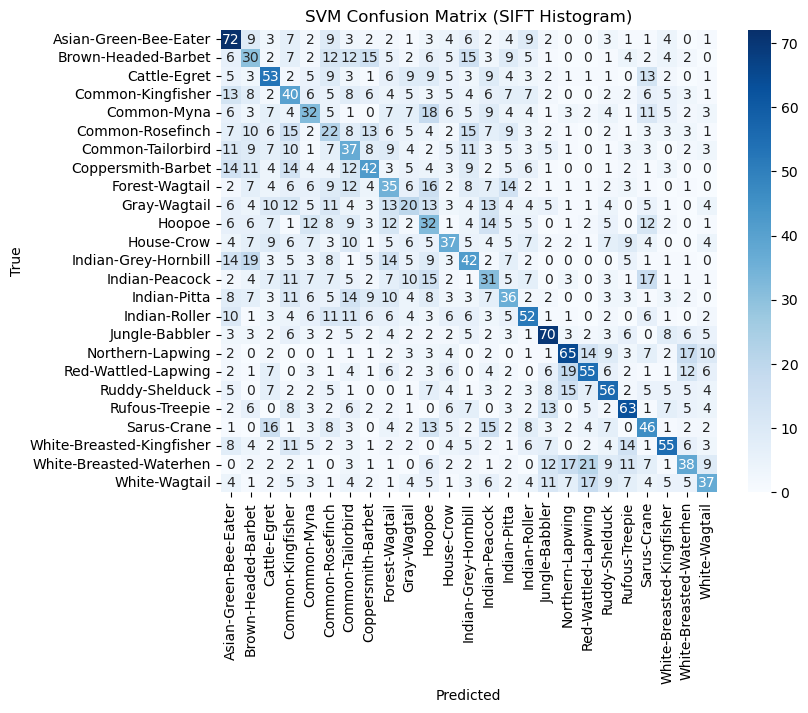

In [45]:
print("SVM (SIFT Histogram) - Metrics:\n")

display_metrics(svm_sift_hist_report)

plot_confusion_matrix(valid_labels, svm_sift_hist_preds, class_names, title="SVM Confusion Matrix (SIFT Histogram)")

In [47]:
# Random Forest

rf_sift_hist_preds, rf_sift_hist_report = train_evaluate_rf(
    train_sift_hist, train_labels, valid_sift_hist, valid_labels, class_names
)


Random Forest (SIFT Histogram) - Metrics:

 Accuracy  Precision  Recall  F1-score
   0.2008     0.1996  0.2008    0.1967


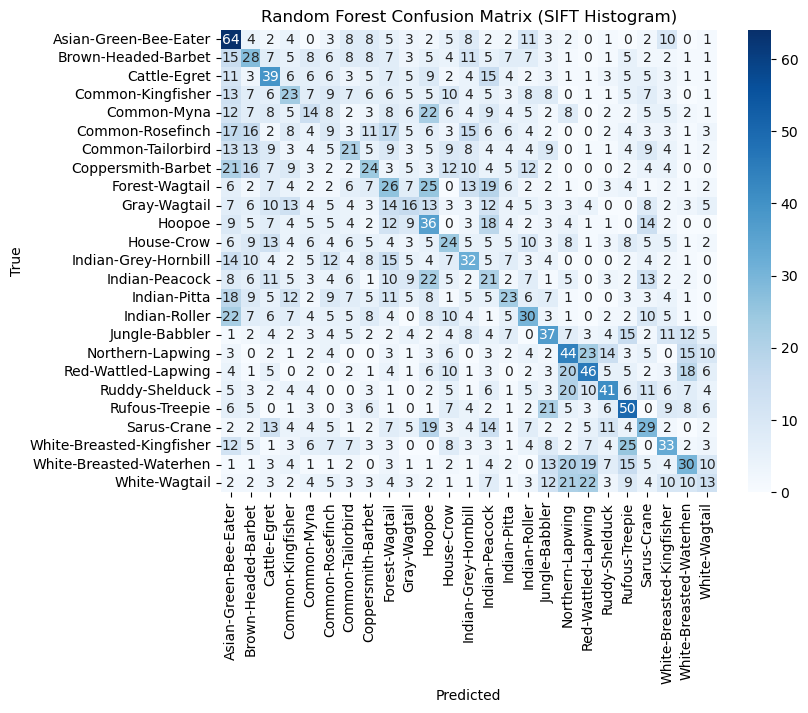

In [48]:
print("Random Forest (SIFT Histogram) - Metrics:\n")

display_metrics(rf_sift_hist_report)

plot_confusion_matrix(valid_labels, rf_sift_hist_preds, class_names, title="Random Forest Confusion Matrix (SIFT Histogram)")

In [49]:
# Naive Bayes

nb_sift_hist_preds, nb_sift_hist_report = train_evaluate_nb(
    train_sift_hist, train_labels, valid_sift_hist, valid_labels, class_names
)


Naive Bayes (SIFT Histogram) - Metrics:

 Accuracy  Precision  Recall  F1-score
   0.1728     0.1703  0.1728    0.1569


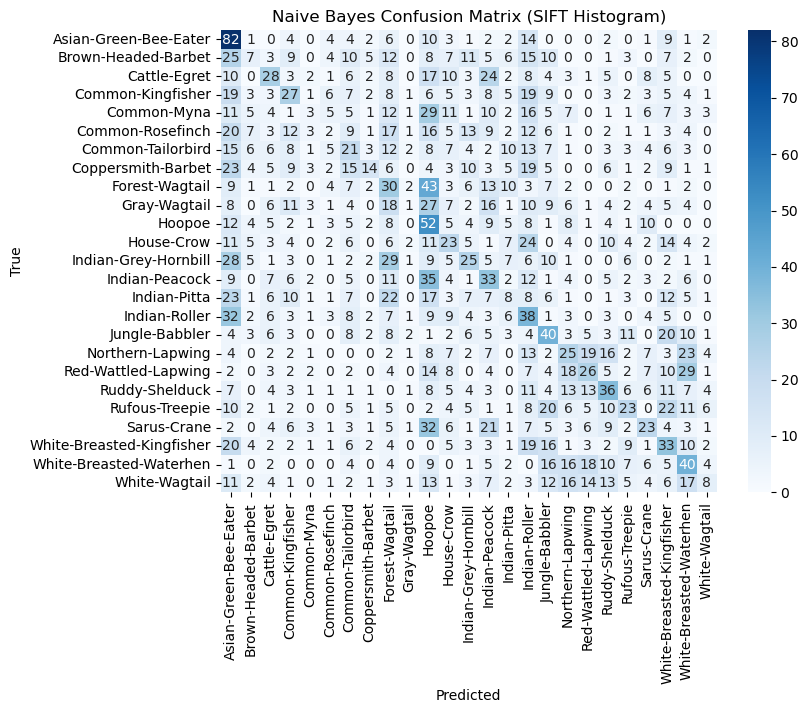

In [50]:
print("Naive Bayes (SIFT Histogram) - Metrics:\n")

display_metrics(nb_sift_hist_report)

plot_confusion_matrix(valid_labels, nb_sift_hist_preds, class_names, title="Naive Bayes Confusion Matrix (SIFT Histogram)")

### HoG

The HoG (Histogram of Oriented Gradients) method works by calculating the distribution of gradient directions in small parts of an image. Simply, it calculates the gradients (or edges) in an image and puts them into bins by looking their orientation within small cells. The histograms calculated from all the cells are combined into a feature vector. That way, we have a feature vector that represents the local shapes and textures in the image. The gradients are calculated on grayscale images, so the color information is lost. To make sure the features are consistent, they’re normalized before being used. The effectiveness of this approach with different classifiers will be compared and discussed in the Results and Findings section.

The parameters pixels_per_cell and cells_per_block parameters are raised to have fewer features as with lower values of this parameters, the feature size would be too large for the SVM to be feasible. At first, we were getting 8100 features (pixels_per_cell 16x16, cells_per_block 2x2), with this hyperparameters (pixels_per_cell 64x64, cells_per_block 4x4) we are getting 144 features.

In [17]:
def extract_hog_features(dataset, pixels_per_cell=(64, 64), cells_per_block=(4, 4), orientations=9):
    features = []
    labels = []
    for img_pil, label in tqdm(dataset, desc="Extracting HOG Features"):
        img = np.array(img_pil)
        if len(img.shape) == 3:
            img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        hog_feat = hog(img, orientations=orientations, pixels_per_cell=pixels_per_cell,
                       cells_per_block=cells_per_block, block_norm='L2-Hys', feature_vector=True)
        features.append(hog_feat)
        labels.append(label)
    return np.array(features), np.array(labels)

In [18]:
# Extract HOG features
train_hog_feat, train_labels = extract_hog_features(train_dataset)
valid_hog_feat, valid_labels = extract_hog_features(valid_dataset)

Extracting HOG Features: 100%|██████████| 3750/3750 [01:17<00:00, 48.61it/s]


Our HoG features have the size 144.

In [26]:
# Print feature shapes
print(f"Train HOG Features Shape: {train_hog_feat.shape}")
print(f"Validation HOG Features Shape: {valid_hog_feat.shape}")

Train HOG Features Shape: (30000, 144)
Validation HOG Features Shape: (3750, 144)


In [51]:
# SVM

svm_hog_preds, svm_hog_report = train_evaluate_svm(
    train_hog_feat, train_labels, valid_hog_feat, valid_labels, class_names,
    kernel='poly', C=1.0, degree=3, random_state=42
)



SVM (HOG Features) - Metrics:

 Accuracy  Precision  Recall  F1-score
   0.4027     0.4069  0.4027    0.4025


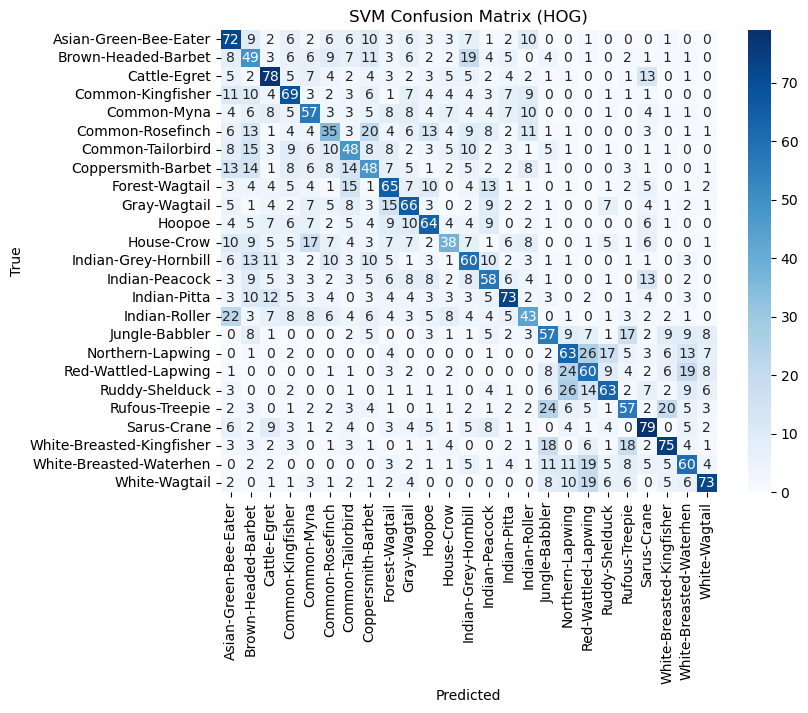

In [52]:
print("SVM (HOG Features) - Metrics:\n")

display_metrics(svm_hog_report)

plot_confusion_matrix(valid_labels, svm_hog_preds, class_names, title="SVM Confusion Matrix (HOG)")

In [53]:
# Random Forest

rf_hog_preds, rf_hog_report = train_evaluate_rf(
    train_hog_feat, train_labels, valid_hog_feat, valid_labels, class_names
)


Random Forest (HOG Features) - Metrics:

 Accuracy  Precision  Recall  F1-score
   0.3339      0.336  0.3339    0.3283


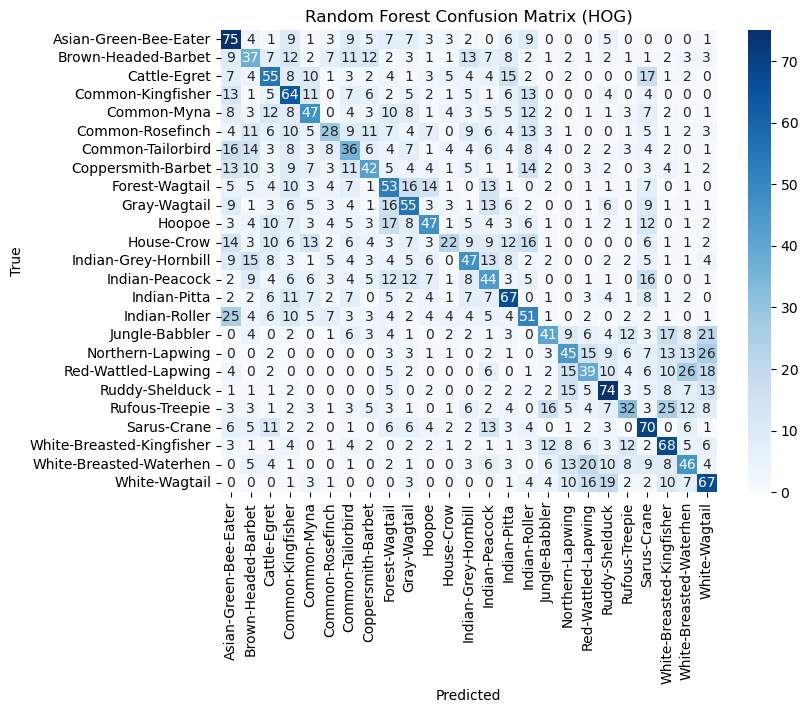

In [54]:
print("Random Forest (HOG Features) - Metrics:\n")

display_metrics(rf_hog_report)

plot_confusion_matrix(valid_labels, rf_hog_preds, class_names, title="Random Forest Confusion Matrix (HOG)")

In [55]:
# Naive Bayes

nb_hog_preds, nb_hog_report = train_evaluate_nb(
    train_hog_feat, train_labels, valid_hog_feat, valid_labels, class_names
)


Naive Bayes (HOG Features) - Metrics:

 Accuracy  Precision  Recall  F1-score
   0.1819     0.1845  0.1819    0.1605


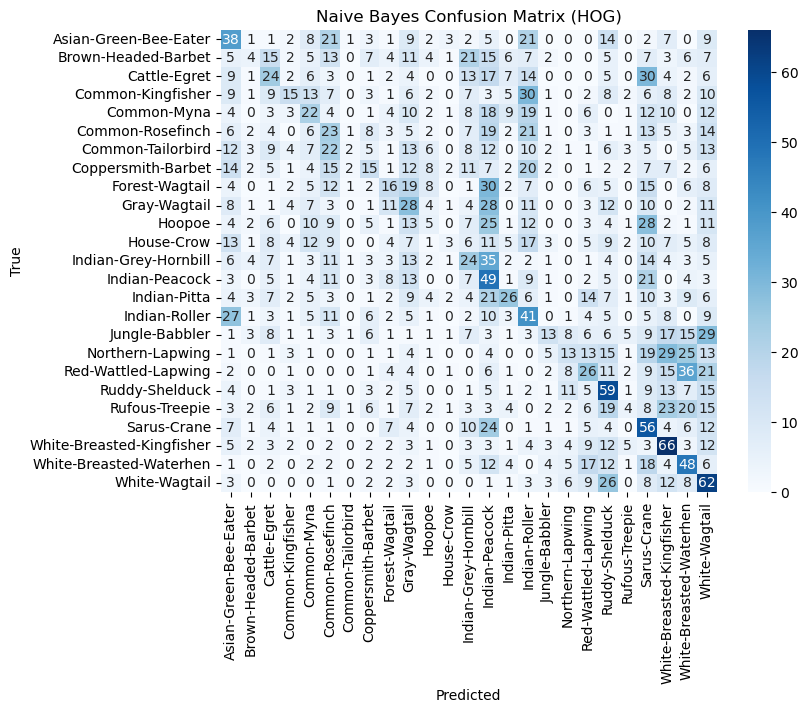

In [56]:
print("Naive Bayes (HOG Features) - Metrics:\n")

display_metrics(nb_hog_report)

plot_confusion_matrix(valid_labels, nb_hog_preds, class_names, title="Naive Bayes Confusion Matrix (HOG)")

### Results and Findings

By looking at the accuracy table below, it can be seen that the best accuracy (0.8901) is achieved by Color Histogram features with Random Forest. Compared to the other results, this is a astonishing score. It highlights the importance of the color information in classfying birds as the other two classifiers use grayscale images. It is also logical as the birds have similar features (claws, wings, beak), but they can have distinct colors which would help to identify them. However, SVM gave an accuracy of 0.4256 with the same color histogram features. This indicates that SVM can be better with hyperparameter tuning as it is done in the section after this one. It also indicates that Random Forest were able to draw better decision boundaries with color histogram features.

The best result with HoG features were achieved by using a SVM, with an accuracy of 0.4027. It suggests that while shape and texture information is still useful, it is still very much less useful than color in this dataset.

SIFT + BoW features got the worst results overall with all models. Possible reasons are visual codebook size not being enough, birds having similar features to each other and without color information them being similar to each other, having decreased performance within intra-class species.

Naive Bayes consistently yielded the lowest accuracies, showing its limitations with these feature types as it is highly possible of this features to be correlated with each other.

In [57]:
print(f"Accuracy Table for Feature Extractors and Classifiers")

results = {
    "SVM": [
        svm_color_hist_report["accuracy"], 
        svm_sift_hist_report["accuracy"], 
        svm_hog_report["accuracy"]
    ],
    "Random Forest": [
        rf_color_hist_report["accuracy"], 
        rf_sift_hist_report["accuracy"], 
        rf_hog_report["accuracy"]
    ],
    "Naive Bayes": [
        nb_color_hist_report["accuracy"], 
        nb_sift_hist_report["accuracy"], 
        nb_hog_report["accuracy"]
    ]
}

feature_extractors = ["Color Histogram", "SIFT + BoW", "HoG"]

df_results = pd.DataFrame(results, index=feature_extractors)
df_results = df_results.round(4)
df_results

Accuracy Table for Feature Extractors and Classifiers


,SVM,Random Forest,Naive Bayes
Color Histogram,0.4256,0.8901,0.1803
SIFT + BoW,0.2928,0.2008,0.1728
HoG,0.4027,0.3339,0.1819


### Bonus: Hyperparameter Search for SVM with Color Histograms

This is a bonus section that is not been used in the later sections. From the previous section, we saw that with Color Histograms, SVM gave much worse accuracy (0.4256) than Random Forest (0.8901). In this section, we will search hyperparameters for this SVM. This section is added to show the importance of hyperparameter tuning, however not to hinder with the workflow of the assignment, it is decided that it should be a bonus section.

First, the kernel poly and degree of 3 is kept the same to test the effect of varying regularization parameter C with values 0.1, 1, 10. It can be seen that having a bigger C value allows the SVM to fit the training data more closely, leading to better performance.

In [59]:
# Try SVM poly kernel with varying C values

svm_results = {}

# Poly kernel, degree 3, c = 0.1
preds_poly3_c01, report_poly3_c01 = train_evaluate_svm(
    train_color_hist, train_labels, valid_color_hist, valid_labels, class_names,
    kernel='poly', C=0.1, degree=3, random_state=42
)
svm_results['poly_deg3_c0.1'] = report_poly3_c01['accuracy']

# Poly kernel, degree 3, c = 1
preds_poly3_c1, report_poly3_c1 = train_evaluate_svm(
    train_color_hist, train_labels, valid_color_hist, valid_labels, class_names,
    kernel='poly', C=1, degree=3, random_state=42
)
svm_results['poly_deg3_c1'] = report_poly3_c1['accuracy']

# Poly kernel, degree 3, c = 10
preds_poly3_c10, report_poly3_c10 = train_evaluate_svm(
    train_color_hist, train_labels, valid_color_hist, valid_labels, class_names,
    kernel='poly', C=10, degree=3, random_state=42
)
svm_results['poly_deg3_c10'] = report_poly3_c10['accuracy']

# Show all results
print("\nSummary of SVM Poly Degree 3 with varying C value experiments (accuracy):")
for k, v in svm_results.items():
    print(f"{k}: {v:.4f}")


Summary of SVM Poly Degree 3 with varying C value experiments (accuracy):
poly_deg3_c0.1: 0.2301
poly_deg3_c1: 0.4256
poly_deg3_c10: 0.6587


After we selected our C value, we looked at different degrees for the poly kernel. It can be seen that setting the degree higher gave better results (degree 4 with 0.6981 accuracy) as it captured the complex relationship between the color histogram features. 

In [60]:
# Try SVM poly kernel with varying degrees and C value of 10

svm_results = {}

# Poly kernel, degree 2, c = 10
preds_poly2_c10, report_poly2_c10 = train_evaluate_svm(
    train_color_hist, train_labels, valid_color_hist, valid_labels, class_names,
    kernel='poly', C=10, degree=2, random_state=42
)
svm_results['poly_deg2_c10'] = report_poly2_c10['accuracy']

# Poly kernel, degree 3, c = 10
preds_poly3_c10, report_poly3_c10 = train_evaluate_svm(
    train_color_hist, train_labels, valid_color_hist, valid_labels, class_names,
    kernel='poly', C=10, degree=3, random_state=42
)
svm_results['poly_deg3_c10'] = report_poly3_c10['accuracy']

# Poly kernel, degree 4, c = 10
preds_poly4_c10, report_poly4_c10 = train_evaluate_svm(
    train_color_hist, train_labels, valid_color_hist, valid_labels, class_names,
    kernel='poly', C=10, degree=4, random_state=42
)
svm_results['poly_deg4_c10'] = report_poly4_c10['accuracy']

# Show all results
print("\nSummary of SVM Poly varying degrees with C=10 experiments (accuracy):")
for k, v in svm_results.items():
    print(f"{k}: {v:.4f}")


Summary of SVM Poly varying degrees with C=10 experiments (accuracy):
poly_deg2_c10: 0.5571
poly_deg3_c10: 0.6587
poly_deg4_c10: 0.6981


Some more experiments with different kernels and settings.

In [61]:
# Try SVM Linear kernel with c = 10 and RBF Kernel with different gamma settings, c = 10

svm_results = {}

# Linear kernel
preds_linear_c10, report_linear_c10 = train_evaluate_svm(
    train_color_hist, train_labels, valid_color_hist, valid_labels, class_names,
    kernel='linear', C=10, random_state=42
)
svm_results['linear_c10'] = report_linear_c10['accuracy']

# RBF kernel, gamma = 'scale'
preds_rbf_scale_c10, report_rbf_scale_c10 = train_evaluate_svm(
    train_color_hist, train_labels, valid_color_hist, valid_labels, class_names,
    kernel='rbf', C=10, gamma='scale', random_state=42
)
svm_results['rbf_scale_c10'] = report_rbf_scale_c10['accuracy']

# RBF kernel, gamma = 'auto'
preds_rbf_auto_c10, report_rbf_auto_c10 = train_evaluate_svm(
    train_color_hist, train_labels, valid_color_hist, valid_labels, class_names,
    kernel='rbf', C=10, gamma='auto', random_state=42
)
svm_results['rbf_auto_c10'] = report_rbf_auto_c10['accuracy']

# Show all results
print("\nSummary of SVM Linear and RBF kernels with C=10 experiments (accuracy):")
for k, v in svm_results.items():
    print(f"{k}: {v:.4f}")



Summary of SVM Linear and RBF kernels with C=10 experiments (accuracy):
linear_c10: 0.3251
rbf_scale_c10: 0.6411
rbf_auto_c10: 0.1872


This section highlights the importance of hyperparameter tuning especially for the SVM.

## Part 2: Principal Component Analysis and Feature Selection

In Part 2, PCA and SelectKBest feature elimination techniques are used with the features that are generated in Part 1. Then, they are used to train and evaluate the same models that'd been used in the Part 1. The feature elimination methods are explained under their respective titles. Results and comparisons with Part 1 is discussed under Results and Findings title.

### PCA Feature Elimination

In this section, PCA (Principal Component Analysis) is applied to the features we had from Part 1 and these new features are evaluated with the same models from Part 1. It is a dimension reduction technique used to reduce the number of features in a dataset. It transforms the features into a smaller set of new features that are called principal components. They are selected to be uncorrelated and serve the purpose of keeping as much of the feature variance that the original dataset had. By using PCA, we can simplify the dataset which makes the models run faster, also it can also help prevent overfitting.

In [62]:
def apply_pca_reduction(train_features, n_components=0.95):

    # PCA (retain 95% variance or use int for number of components)
    pca = PCA(n_components=n_components, random_state=42)
    train_pca = pca.fit_transform(train_features)

    return {
        "pca_features": train_pca,
        "pca_model": pca,
    }

The previous feature dimensions and after can be seen in these code blocks.

In [64]:
# Color Histogram PCA
color_hist_pca_result = apply_pca_reduction(train_color_hist, n_components=0.95)
train_color_hist_pca = color_hist_pca_result["pca_features"]
valid_color_hist_pca = color_hist_pca_result["pca_model"].transform(valid_color_hist)

print(f"Train Color Histogram Features Shape: {train_color_hist.shape}")
print(f"Validation Color Histogram Features Shape: {valid_color_hist.shape}\n")

print(f"Train Color Histogram PCA Features Shape: {train_color_hist_pca.shape}")
print(f"Validation Color Histogram PCA Features Shape: {valid_color_hist_pca.shape}")

Train Color Histogram Features Shape: (30000, 512)
Validation Color Histogram Features Shape: (3750, 512)

Train Color Histogram PCA Features Shape: (30000, 72)
Validation Color Histogram PCA Features Shape: (3750, 72)


In [65]:
# SIFT + BoW PCA
sift_pca_result = apply_pca_reduction(train_sift_hist, n_components=0.95)
train_sift_hist_pca = sift_pca_result["pca_features"]
valid_sift_hist_pca = sift_pca_result["pca_model"].transform(valid_sift_hist)

print(f"Train SIFT Histogram Features Shape: {train_sift_hist.shape}")
print(f"Validation SIFT Histogram Features Shape: {valid_sift_hist.shape}\n")

print(f"Train SIFT Histogram PCA Features Shape: {train_sift_hist_pca.shape}")
print(f"Validation SIFT Histogram PCA Features Shape: {valid_sift_hist_pca.shape}")

Train SIFT Histogram Features Shape: (30000, 200)
Validation SIFT Histogram Features Shape: (3750, 200)

Train SIFT Histogram PCA Features Shape: (30000, 180)
Validation SIFT Histogram PCA Features Shape: (3750, 180)


In [67]:
# HoG PCA
hog_pca_result = apply_pca_reduction(train_hog_feat, n_components=0.95)
train_hog_feat_pca = hog_pca_result["pca_features"]
valid_hog_feat_pca = hog_pca_result["pca_model"].transform(valid_hog_feat)

print(f"Train HOG Features Shape: {train_hog_feat.shape}")
print(f"Validation HOG Features Shape: {valid_hog_feat.shape}\n")

print(f"Train HOG PCA Features Shape: {train_hog_feat_pca.shape}")
print(f"Validation HOG PCA Features Shape: {valid_hog_feat_pca.shape}")

Train HOG Features Shape: (30000, 144)
Validation HOG Features Shape: (3750, 144)

Train HOG PCA Features Shape: (30000, 81)
Validation HOG PCA Features Shape: (3750, 81)


#### Color Histogram

In [70]:
# SVM

svm_color_hist_pca_preds, svm_color_hist_pca_report = train_evaluate_svm(
    train_color_hist_pca, train_labels, valid_color_hist_pca, valid_labels, class_names,
    kernel='poly', C=1.0, degree=3, random_state=42
)


SVM (Color Histogram PCA) - Metrics:

 Accuracy  Precision  Recall  F1-score
   0.4093     0.4189  0.4093    0.4093


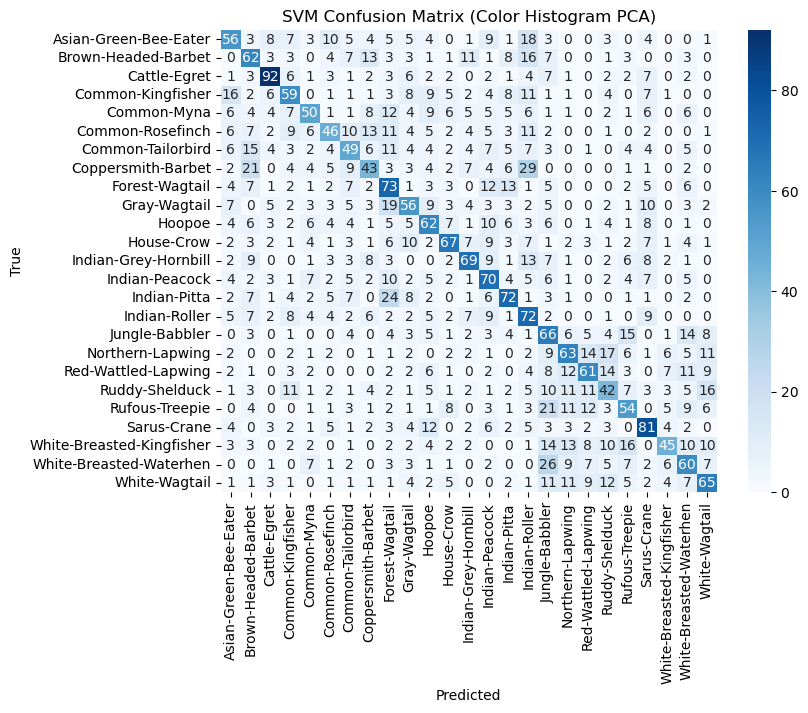

In [71]:
print("SVM (Color Histogram PCA) - Metrics:\n")

display_metrics(svm_color_hist_pca_report)

plot_confusion_matrix(valid_labels, svm_color_hist_pca_preds, class_names, title="SVM Confusion Matrix (Color Histogram PCA)")

In [72]:
# Random Forest

rf_color_hist_pca_preds, rf_color_hist_pca_report = train_evaluate_rf(
    train_color_hist_pca, train_labels, valid_color_hist_pca, valid_labels, class_names
)

Random Forest (Color Histogram PCA) - Metrics:

 Accuracy  Precision  Recall  F1-score
   0.7523     0.7546  0.7523    0.7523


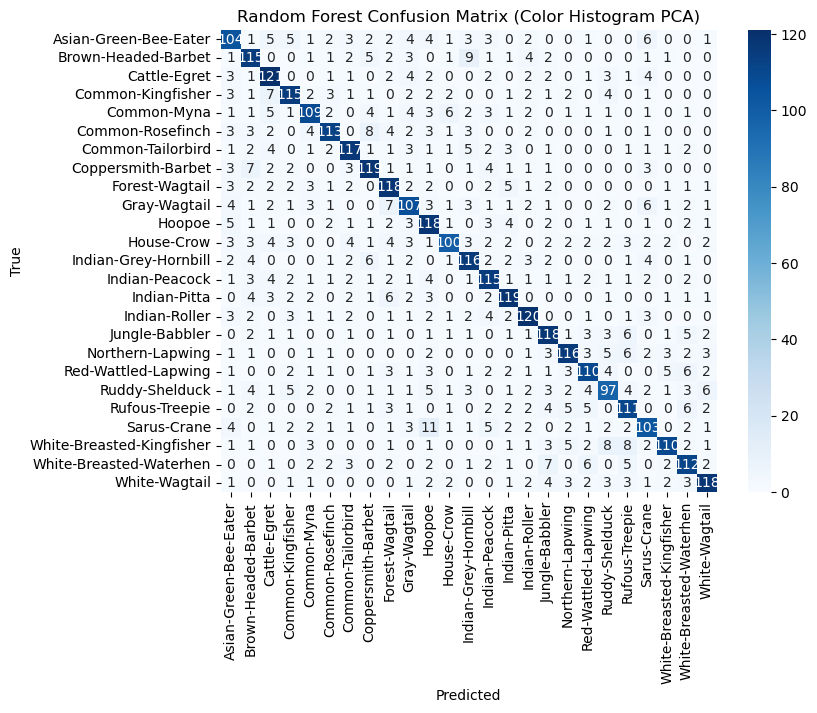

In [73]:
print("Random Forest (Color Histogram PCA) - Metrics:\n")

display_metrics(rf_color_hist_pca_report)

plot_confusion_matrix(valid_labels, rf_color_hist_pca_preds, class_names, title="Random Forest Confusion Matrix (Color Histogram PCA)")

In [74]:
# Naive Bayes

nb_color_hist_pca_preds, nb_color_hist_pca_report = train_evaluate_nb(
    train_color_hist_pca, train_labels, valid_color_hist_pca, valid_labels, class_names
)

Naive Bayes (Color Histogram PCA) - Metrics:

 Accuracy  Precision  Recall  F1-score
   0.1203     0.1342  0.1203    0.1017


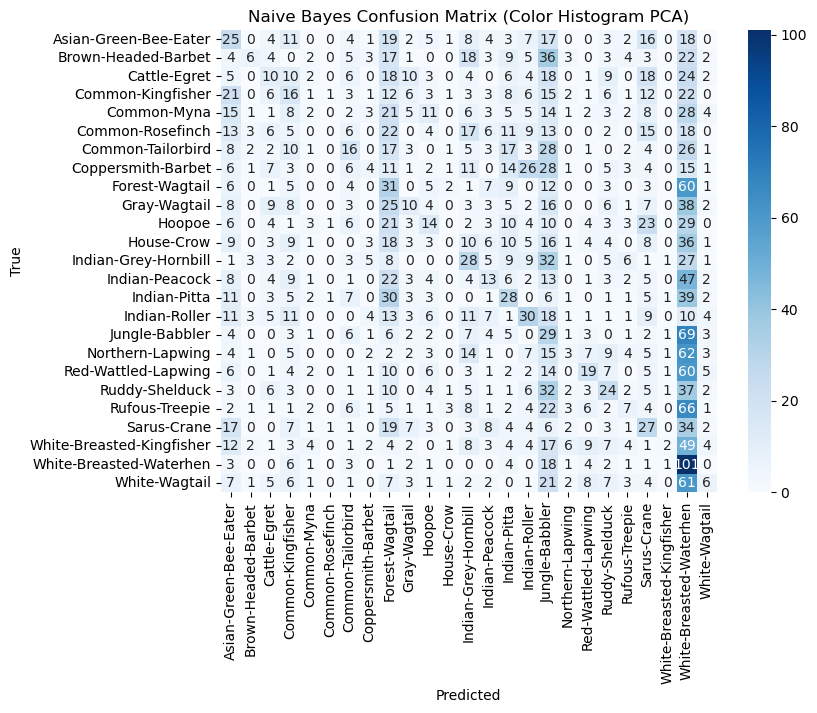

In [75]:
print("Naive Bayes (Color Histogram PCA) - Metrics:\n")

display_metrics(nb_color_hist_pca_report)

plot_confusion_matrix(valid_labels, nb_color_hist_pca_preds, class_names, title="Naive Bayes Confusion Matrix (Color Histogram PCA)")

#### SIFT + BoW

In [76]:
# SVM

svm_sift_hist_pca_preds, svm_sift_hist_pca_report = train_evaluate_svm(
    train_sift_hist_pca, train_labels, valid_sift_hist_pca, valid_labels, class_names,
    kernel='poly', C=1.0, degree=3, random_state=42
)

SVM (SIFT + BoW PCA) - Metrics:

 Accuracy  Precision  Recall  F1-score
    0.284     0.3098   0.284    0.2895


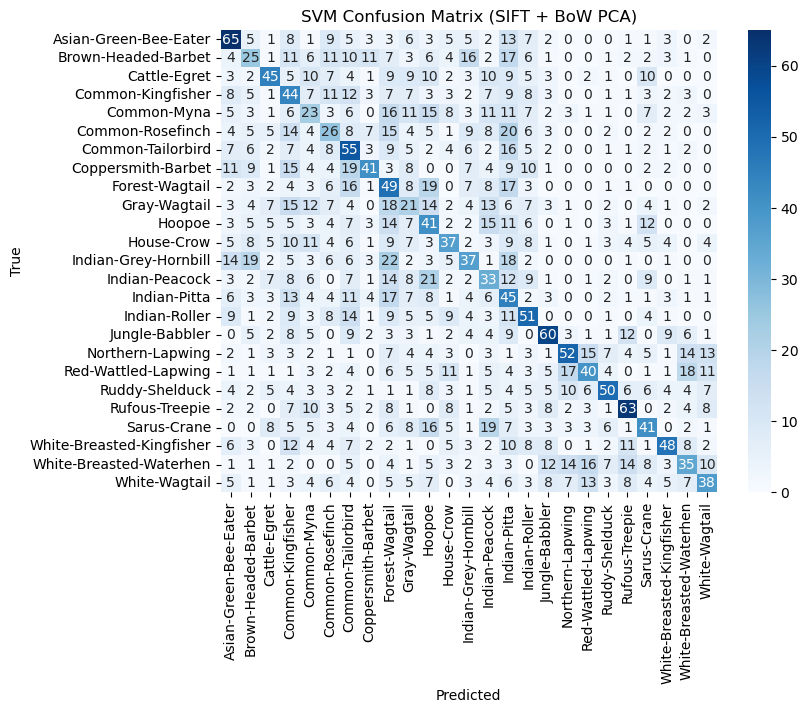

In [77]:
print("SVM (SIFT + BoW PCA) - Metrics:\n")
display_metrics(svm_sift_hist_pca_report)
plot_confusion_matrix(valid_labels, svm_sift_hist_pca_preds, class_names, title="SVM Confusion Matrix (SIFT + BoW PCA)")

In [78]:
# Random Forest

rf_sift_hist_pca_preds, rf_sift_hist_pca_report = train_evaluate_rf(
    train_sift_hist_pca, train_labels, valid_sift_hist_pca, valid_labels, class_names
)


Random Forest (SIFT + BoW PCA) - Metrics:

 Accuracy  Precision  Recall  F1-score
   0.1768     0.1794  0.1768    0.1733


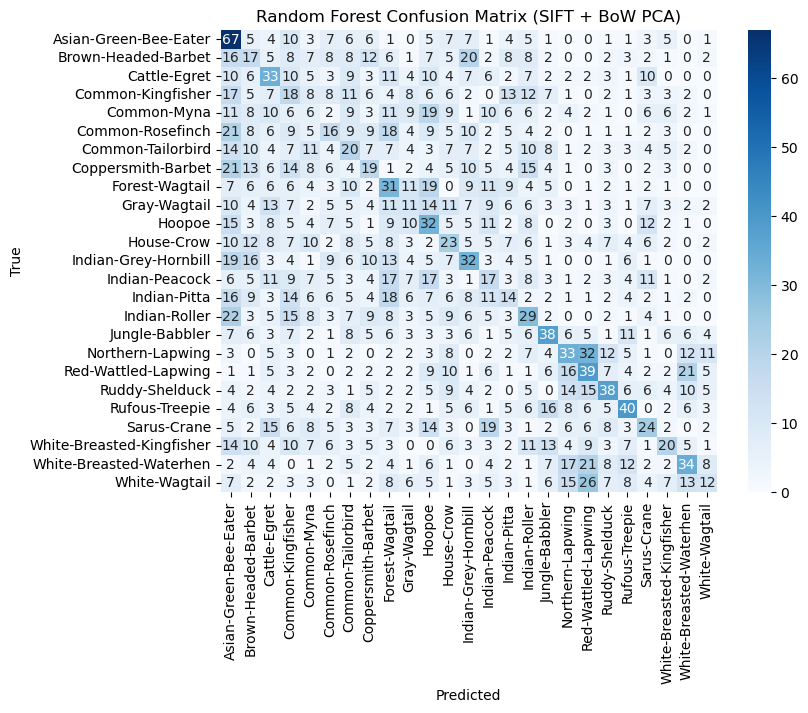

In [79]:
print("Random Forest (SIFT + BoW PCA) - Metrics:\n")
display_metrics(rf_sift_hist_pca_report)
plot_confusion_matrix(valid_labels, rf_sift_hist_pca_preds, class_names, title="Random Forest Confusion Matrix (SIFT + BoW PCA)")

In [80]:
# Naive Bayes

nb_sift_hist_pca_preds, nb_sift_hist_pca_report = train_evaluate_nb(
    train_sift_hist_pca, train_labels, valid_sift_hist_pca, valid_labels, class_names
)


Naive Bayes (SIFT + BoW PCA) - Metrics:

 Accuracy  Precision  Recall  F1-score
   0.1552     0.1594  0.1552     0.142


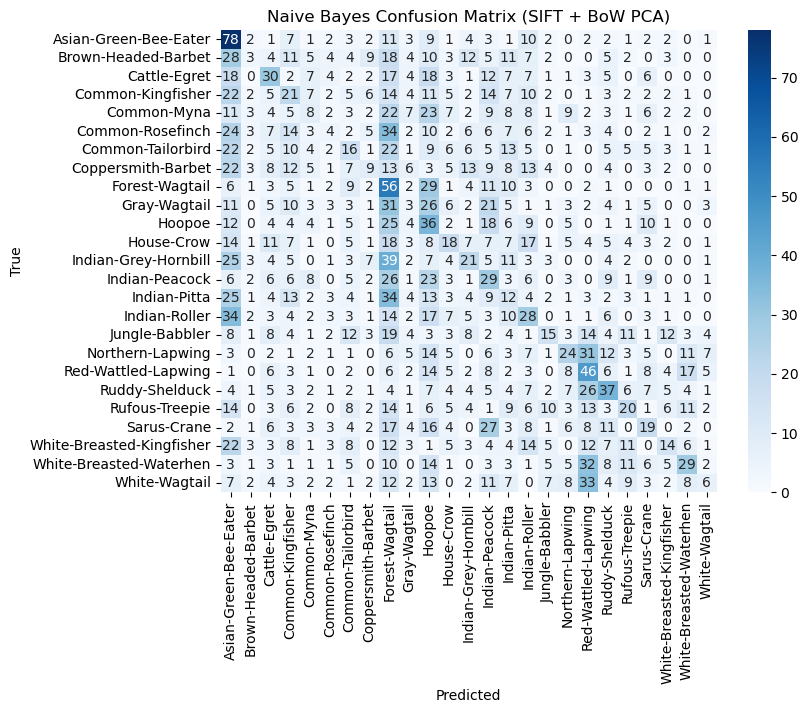

In [81]:
print("Naive Bayes (SIFT + BoW PCA) - Metrics:\n")
display_metrics(nb_sift_hist_pca_report)
plot_confusion_matrix(valid_labels, nb_sift_hist_pca_preds, class_names, title="Naive Bayes Confusion Matrix (SIFT + BoW PCA)")

#### HoG

In [82]:
# SVM

svm_hog_pca_preds, svm_hog_pca_report = train_evaluate_svm(
    train_hog_feat_pca, train_labels, valid_hog_feat_pca, valid_labels, class_names,
    kernel='poly', C=1.0, degree=3, random_state=42
)


SVM (HOG PCA) - Metrics:

 Accuracy  Precision  Recall  F1-score
   0.3531     0.3939  0.3531    0.3585


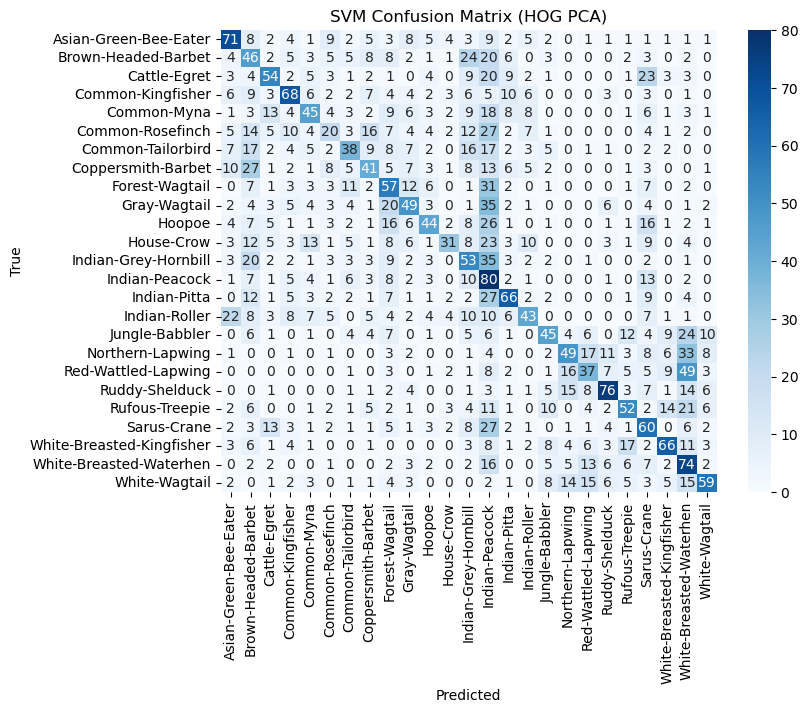

In [83]:
print("SVM (HOG PCA) - Metrics:\n")
display_metrics(svm_hog_pca_report)
plot_confusion_matrix(valid_labels, svm_hog_pca_preds, class_names, title="SVM Confusion Matrix (HOG PCA)")

In [84]:
# Random Forest

rf_hog_pca_preds, rf_hog_pca_report = train_evaluate_rf(
    train_hog_feat_pca, train_labels, valid_hog_feat_pca, valid_labels, class_names
)


Random Forest (HOG PCA) - Metrics:

 Accuracy  Precision  Recall  F1-score
   0.3264     0.3269  0.3264    0.3209


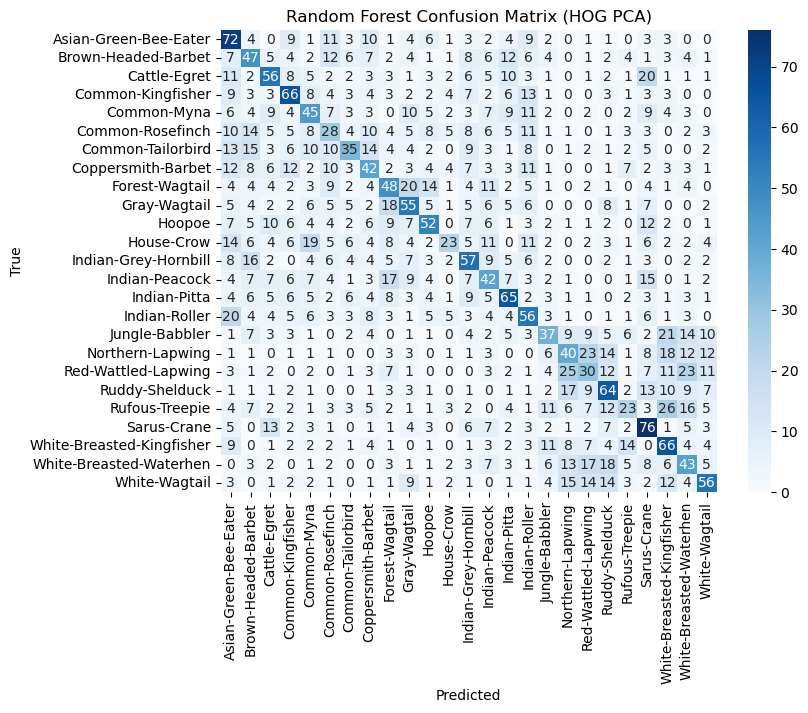

In [85]:
print("Random Forest (HOG PCA) - Metrics:\n")
display_metrics(rf_hog_pca_report)
plot_confusion_matrix(valid_labels, rf_hog_pca_preds, class_names, title="Random Forest Confusion Matrix (HOG PCA)")

In [86]:
# Naive Bayes

nb_hog_pca_preds, nb_hog_pca_report = train_evaluate_nb(
    train_hog_feat_pca, train_labels, valid_hog_feat_pca, valid_labels, class_names
)


Naive Bayes (HOG PCA) - Metrics:

 Accuracy  Precision  Recall  F1-score
   0.2024     0.2085  0.2024    0.1843


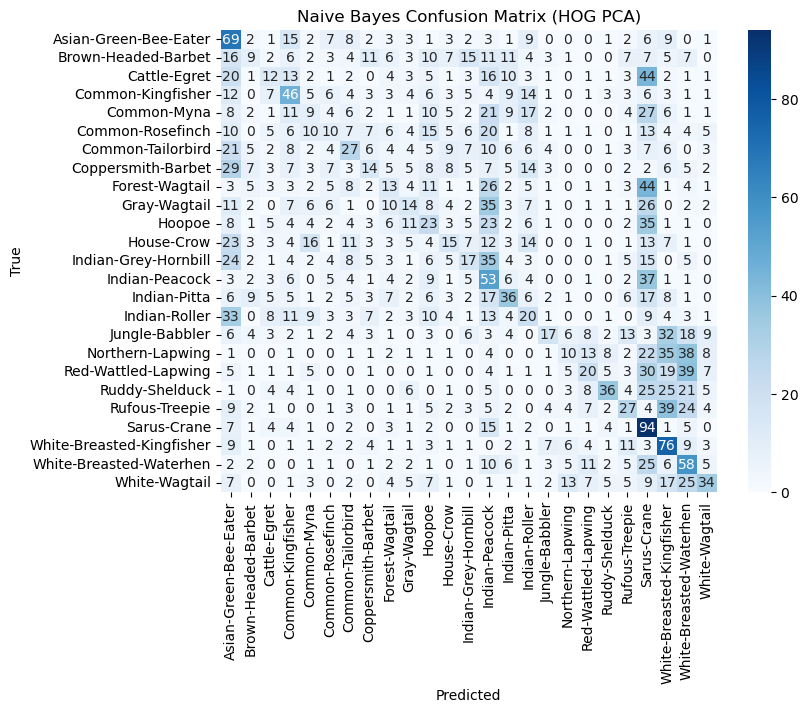

In [87]:

print("Naive Bayes (HOG PCA) - Metrics:\n")
display_metrics(nb_hog_pca_report)
plot_confusion_matrix(valid_labels, nb_hog_pca_preds, class_names, title="Naive Bayes Confusion Matrix (HOG PCA)")

#### Accuracy Results Table

The results are discussed under Results and Findings section in Part 2.

In [88]:
print("Accuracy Table for Feature Extractors and Classifiers (with PCA)")

results_pca = {
    "SVM": [
        svm_color_hist_pca_report["accuracy"], 
        svm_sift_hist_pca_report["accuracy"], 
        svm_hog_pca_report["accuracy"]
    ],
    "Random Forest": [
        rf_color_hist_pca_report["accuracy"], 
        rf_sift_hist_pca_report["accuracy"], 
        rf_hog_pca_report["accuracy"]
    ],
    "Naive Bayes": [
        nb_color_hist_pca_report["accuracy"], 
        nb_sift_hist_pca_report["accuracy"], 
        nb_hog_pca_report["accuracy"]
    ]
}

feature_extractors_pca = ["Color Histogram PCA", "SIFT + BoW PCA", "HoG PCA"]

df_results_pca = pd.DataFrame(results_pca, index=feature_extractors_pca)
df_results_pca = df_results_pca.round(4)
df_results_pca

Accuracy Table for Feature Extractors and Classifiers (with PCA)


,SVM,Random Forest,Naive Bayes
Color Histogram PCA,0.4093,0.7523,0.1203
SIFT + BoW PCA,0.2840,0.1768,0.1552
HoG PCA,0.3531,0.3264,0.2024


### SelectKBest Feature Selection

In this section, SelectKBest feature selection is applied to the features generated in Part 1. SelectKBest is a feature selection method that selects the top k features (50 in our case) based on statistical tests (ANOVA F-value). This way, we keep only the top 50 important features in our dataset which helps speeding up the training and maybe reducing overfitting. The selected features are evaluated on the same models from Part 1. The results are discussed under Results and Findings title.

In [90]:
def apply_selectkbest(train_features, train_labels, k=50):

    selector = SelectKBest(score_func=f_classif, k=k)
    train_selected = selector.fit_transform(train_features, train_labels)
    return {
        "selected_features": train_selected,
        "selector": selector,
    }

It can be seen that with our k choice of 50, features are reduced to 50 for all extractors.

In [95]:
# Color Histogram KBest

color_hist_kbest_result = apply_selectkbest(train_color_hist, train_labels, k=50)
train_color_hist_kbest = color_hist_kbest_result["selected_features"]
valid_color_hist_kbest = color_hist_kbest_result["selector"].transform(valid_color_hist)

print(f"Train Color Histogram Features Shape: {train_color_hist.shape}")
print(f"Validation Color Histogram Features Shape: {valid_color_hist.shape}\n")

print(f"Train Color Histogram KBest Features Shape: {train_color_hist_kbest.shape}")
print(f"Validation Color Histogram KBest Features Shape: {valid_color_hist_kbest.shape}")

Train Color Histogram Features Shape: (30000, 512)
Validation Color Histogram Features Shape: (3750, 512)

Train Color Histogram KBest Features Shape: (30000, 50)
Validation Color Histogram KBest Features Shape: (3750, 50)


In [92]:
# SIFT + BoW KBest

sift_kbest_result = apply_selectkbest(train_sift_hist, train_labels, k=50)
train_sift_hist_kbest = sift_kbest_result["selected_features"]
valid_sift_hist_kbest = sift_kbest_result["selector"].transform(valid_sift_hist)

print(f"Train SIFT Histogram Features Shape: {train_sift_hist.shape}")
print(f"Validation SIFT Histogram Features Shape: {valid_sift_hist.shape}\n")

print(f"Train SIFT Histogram KBest Features Shape: {train_sift_hist_kbest.shape}")
print(f"Validation SIFT Histogram KBest Features Shape: {valid_sift_hist_kbest.shape}")

Train SIFT Histogram Features Shape: (30000, 200)
Validation SIFT Histogram Features Shape: (3750, 200)

Train SIFT Histogram KBest Features Shape: (30000, 50)
Validation SIFT Histogram KBest Features Shape: (3750, 50)


In [93]:
# HoG KBest

hog_kbest_result = apply_selectkbest(train_hog_feat, train_labels, k=50)
train_hog_feat_kbest = hog_kbest_result["selected_features"]
valid_hog_feat_kbest = hog_kbest_result["selector"].transform(valid_hog_feat)

print(f"Train HOG Features Shape: {train_hog_feat.shape}")
print(f"Validation HOG Features Shape: {valid_hog_feat.shape}\n")

print(f"Train HOG KBest Features Shape: {train_hog_feat_kbest.shape}")
print(f"Validation HOG KBest Features Shape: {valid_hog_feat_kbest.shape}")

Train HOG Features Shape: (30000, 144)
Validation HOG Features Shape: (3750, 144)

Train HOG KBest Features Shape: (30000, 50)
Validation HOG KBest Features Shape: (3750, 50)


#### Color Histogram

In [96]:
# SVM

svm_color_hist_kbest_preds, svm_color_hist_kbest_report = train_evaluate_svm(
    train_color_hist_kbest, train_labels, valid_color_hist_kbest, valid_labels, class_names,
    kernel='poly', C=1.0, degree=3, random_state=42
)

SVM (Color Histogram KBest) - Metrics:

 Accuracy  Precision  Recall  F1-score
   0.2432     0.3316  0.2432    0.2583


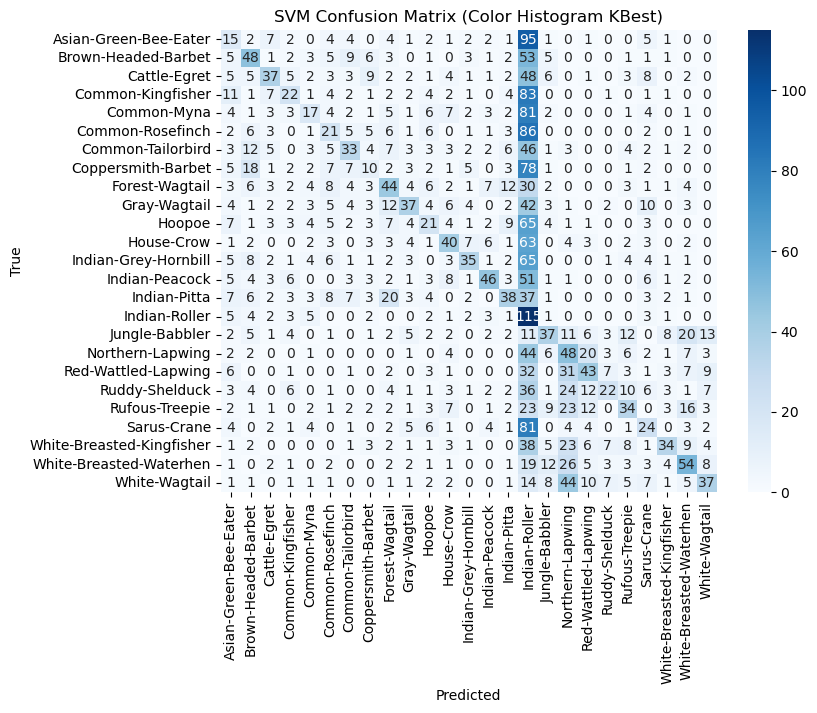

In [97]:
print("SVM (Color Histogram KBest) - Metrics:\n")
display_metrics(svm_color_hist_kbest_report)
plot_confusion_matrix(valid_labels, svm_color_hist_kbest_preds, class_names, title="SVM Confusion Matrix (Color Histogram KBest)")

In [98]:
# Random Forest

rf_color_hist_kbest_preds, rf_color_hist_kbest_report = train_evaluate_rf(
    train_color_hist_kbest, train_labels, valid_color_hist_kbest, valid_labels, class_names
)

Random Forest (Color Histogram KBest) - Metrics:

 Accuracy  Precision  Recall  F1-score
   0.8053     0.8077  0.8053    0.8056


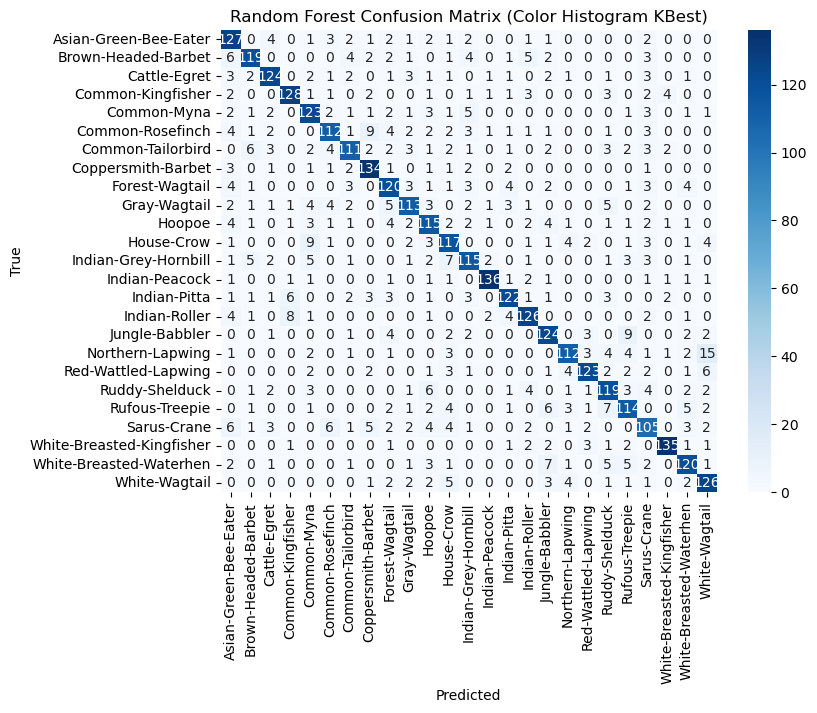

In [99]:
print("Random Forest (Color Histogram KBest) - Metrics:\n")
display_metrics(rf_color_hist_kbest_report)
plot_confusion_matrix(valid_labels, rf_color_hist_kbest_preds, class_names, title="Random Forest Confusion Matrix (Color Histogram KBest)")


In [100]:
# Naive Bayes

nb_color_hist_kbest_preds, nb_color_hist_kbest_report = train_evaluate_nb(
    train_color_hist_kbest, train_labels, valid_color_hist_kbest, valid_labels, class_names
)

Naive Bayes (Color Histogram KBest) - Metrics:

 Accuracy  Precision  Recall  F1-score
   0.1077     0.2085  0.1077    0.0975


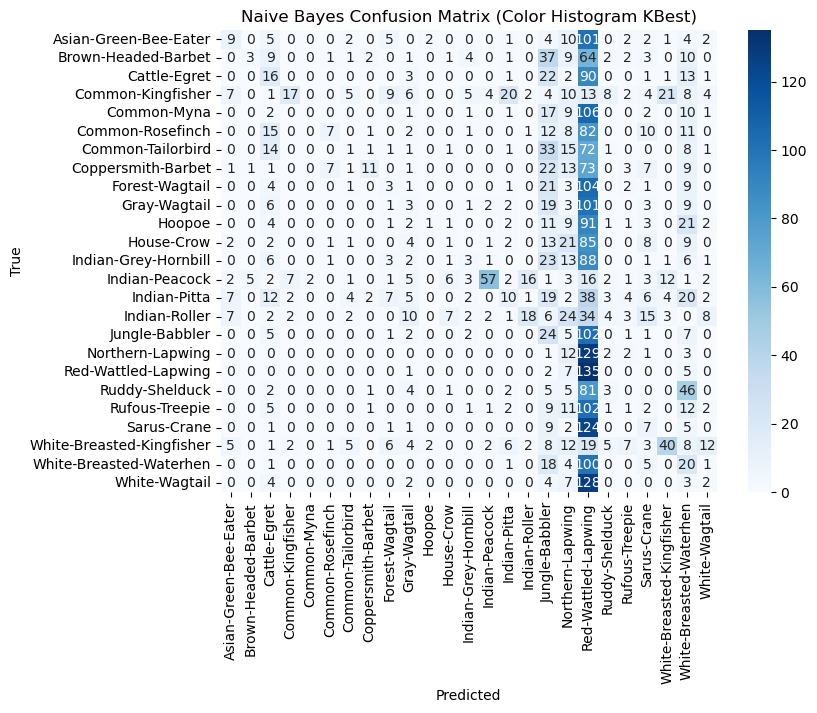

In [101]:
print("Naive Bayes (Color Histogram KBest) - Metrics:\n")
display_metrics(nb_color_hist_kbest_report)
plot_confusion_matrix(valid_labels, nb_color_hist_kbest_preds, class_names, title="Naive Bayes Confusion Matrix (Color Histogram KBest)")


#### SIFT + BoW

In [102]:
# SVM

svm_sift_hist_kbest_preds, svm_sift_hist_kbest_report = train_evaluate_svm(
    train_sift_hist_kbest, train_labels, valid_sift_hist_kbest, valid_labels, class_names,
    kernel='poly', C=1.0, degree=3, random_state=42
)

SVM (SIFT + BoW KBest) - Metrics:

 Accuracy  Precision  Recall  F1-score
   0.1784     0.1957  0.1784    0.1761


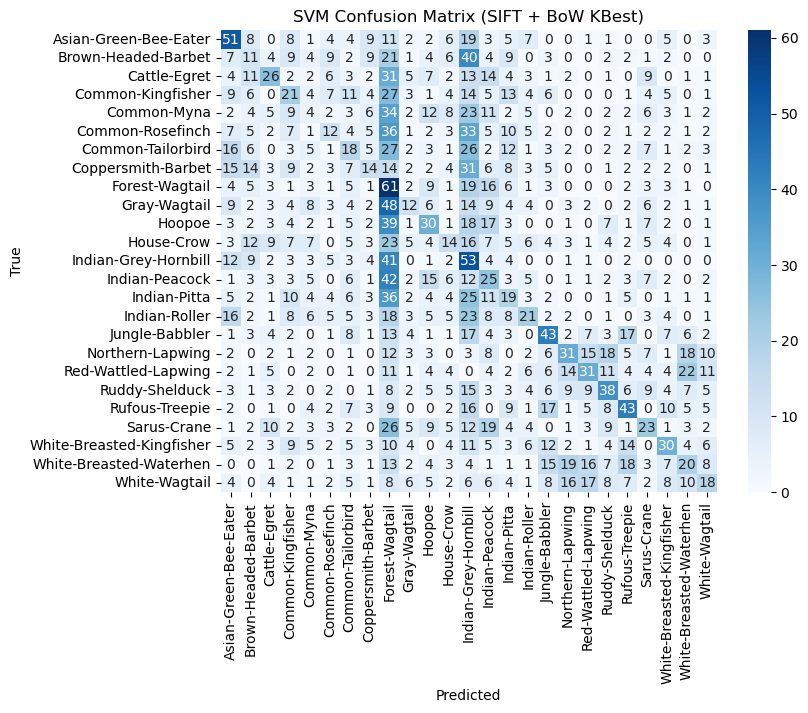

In [103]:
print("SVM (SIFT + BoW KBest) - Metrics:\n")
display_metrics(svm_sift_hist_kbest_report)
plot_confusion_matrix(valid_labels, svm_sift_hist_kbest_preds, class_names, title="SVM Confusion Matrix (SIFT + BoW KBest)")


In [104]:
# Random Forest

rf_sift_hist_kbest_preds, rf_sift_hist_kbest_report = train_evaluate_rf(
    train_sift_hist_kbest, train_labels, valid_sift_hist_kbest, valid_labels, class_names
)

Random Forest (SIFT + BoW KBest) - Metrics:

 Accuracy  Precision  Recall  F1-score
   0.1803     0.1787  0.1803    0.1761


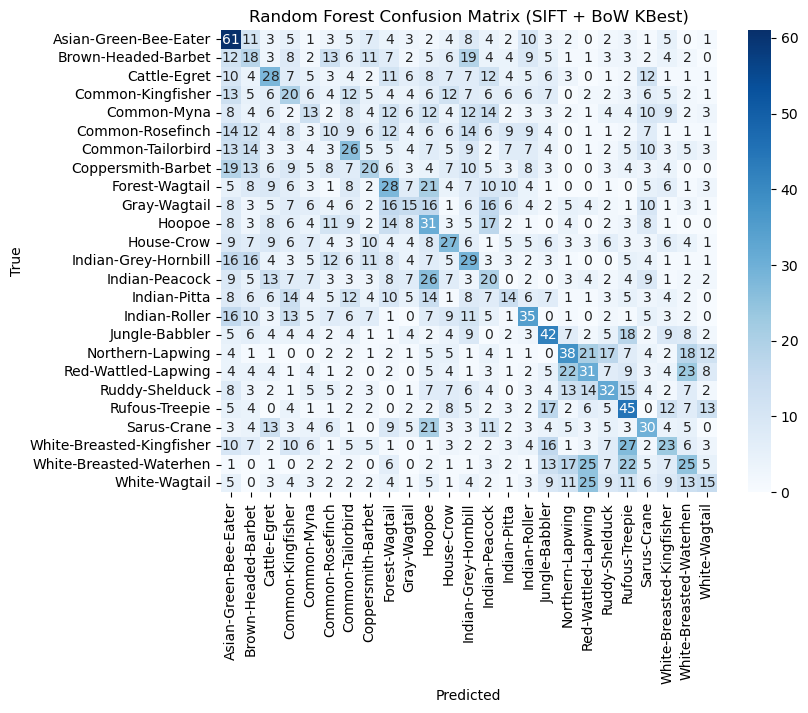

In [105]:
print("Random Forest (SIFT + BoW KBest) - Metrics:\n")
display_metrics(rf_sift_hist_kbest_report)
plot_confusion_matrix(valid_labels, rf_sift_hist_kbest_preds, class_names, title="Random Forest Confusion Matrix (SIFT + BoW KBest)")


In [106]:
# Naive Bayes

nb_sift_hist_kbest_preds, nb_sift_hist_kbest_report = train_evaluate_nb(
    train_sift_hist_kbest, train_labels, valid_sift_hist_kbest, valid_labels, class_names
)

Naive Bayes (SIFT + BoW KBest) - Metrics:

 Accuracy  Precision  Recall  F1-score
   0.1413     0.1429  0.1413    0.1248


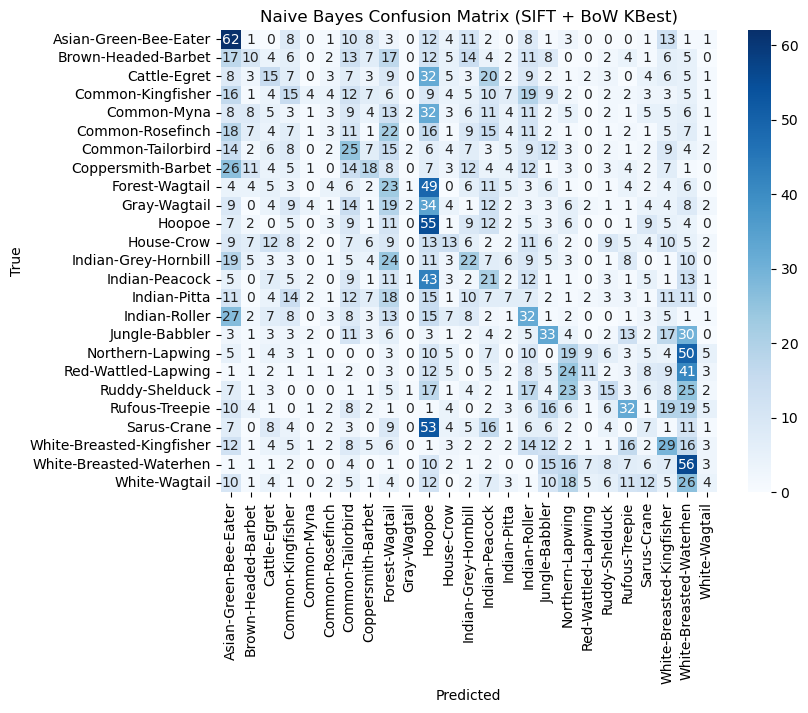

In [107]:
print("Naive Bayes (SIFT + BoW KBest) - Metrics:\n")
display_metrics(nb_sift_hist_kbest_report)
plot_confusion_matrix(valid_labels, nb_sift_hist_kbest_preds, class_names, title="Naive Bayes Confusion Matrix (SIFT + BoW KBest)")


#### HoG

In [108]:
# SVM

svm_hog_kbest_preds, svm_hog_kbest_report = train_evaluate_svm(
    train_hog_feat_kbest, train_labels, valid_hog_feat_kbest, valid_labels, class_names,
    kernel='poly', C=1.0, degree=3, random_state=42
)

SVM (HOG KBest) - Metrics:

 Accuracy  Precision  Recall  F1-score
    0.284      0.283   0.284    0.2817


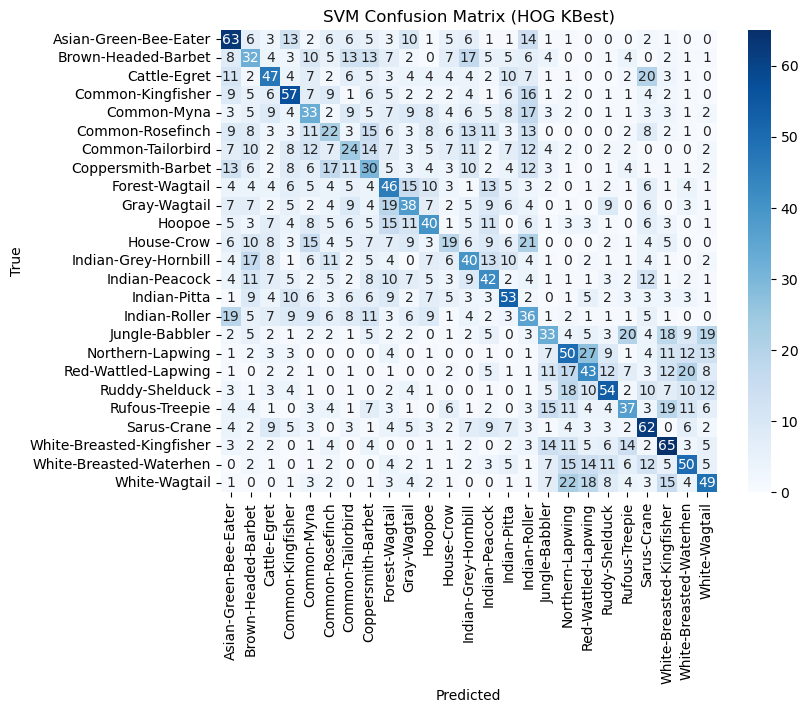

In [109]:
print("SVM (HOG KBest) - Metrics:\n")
display_metrics(svm_hog_kbest_report)
plot_confusion_matrix(valid_labels, svm_hog_kbest_preds, class_names, title="SVM Confusion Matrix (HOG KBest)")


In [110]:
# Random Forest

rf_hog_kbest_preds, rf_hog_kbest_report = train_evaluate_rf(
    train_hog_feat_kbest, train_labels, valid_hog_feat_kbest, valid_labels, class_names
)

Random Forest (HOG KBest) - Metrics:

 Accuracy  Precision  Recall  F1-score
   0.3061     0.3049  0.3061    0.3007


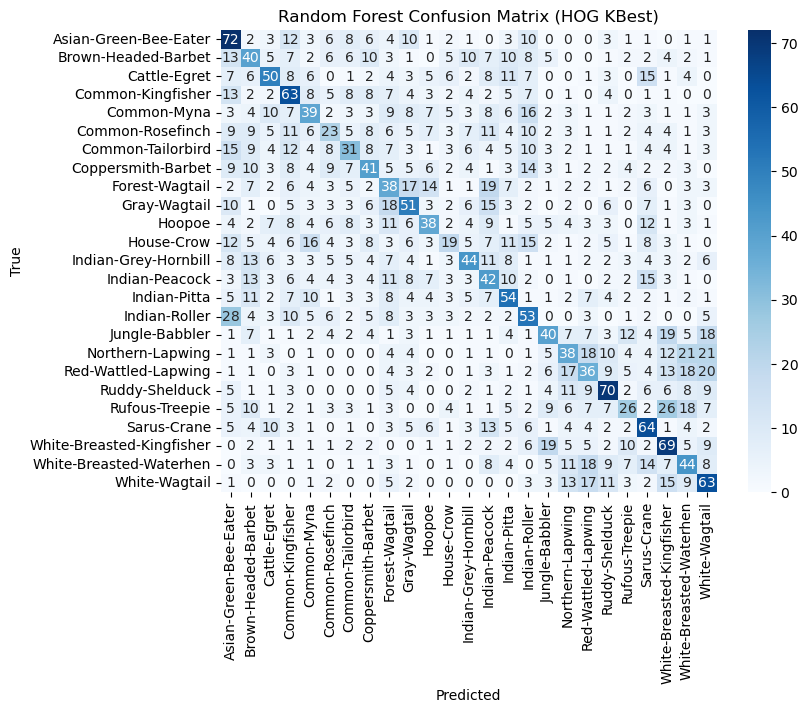

In [111]:
print("Random Forest (HOG KBest) - Metrics:\n")
display_metrics(rf_hog_kbest_report)
plot_confusion_matrix(valid_labels, rf_hog_kbest_preds, class_names, title="Random Forest Confusion Matrix (HOG KBest)")


In [112]:
 # Naive Bayes

nb_hog_kbest_preds, nb_hog_kbest_report = train_evaluate_nb(
    train_hog_feat_kbest, train_labels, valid_hog_feat_kbest, valid_labels, class_names
)

Naive Bayes (HOG KBest) - Metrics:

 Accuracy  Precision  Recall  F1-score
   0.1485     0.1358  0.1485    0.1228


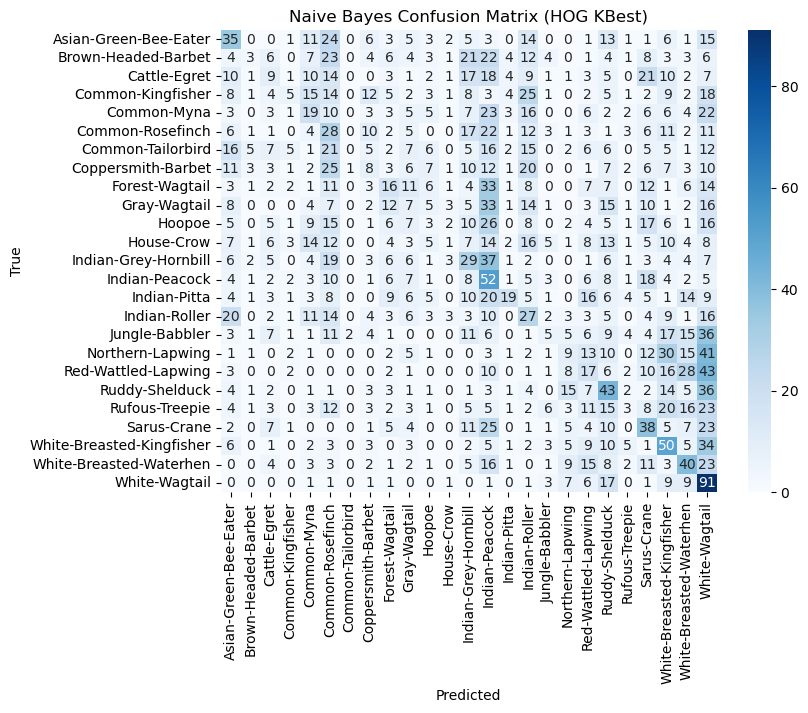

In [113]:
print("Naive Bayes (HOG KBest) - Metrics:\n")
display_metrics(nb_hog_kbest_report)
plot_confusion_matrix(valid_labels, nb_hog_kbest_preds, class_names, title="Naive Bayes Confusion Matrix (HOG KBest)")

#### Accuracy Results Table

The results are discussed under Results and Findings section in Part 2.

In [114]:
print("Accuracy Table for Feature Extractors and Classifiers (with SelectKBest)")

results_kbest = {
    "SVM": [
        svm_color_hist_kbest_report["accuracy"], 
        svm_sift_hist_kbest_report["accuracy"], 
        svm_hog_kbest_report["accuracy"]
    ],
    "Random Forest": [
        rf_color_hist_kbest_report["accuracy"], 
        rf_sift_hist_kbest_report["accuracy"], 
        rf_hog_kbest_report["accuracy"]
    ],
    "Naive Bayes": [
        nb_color_hist_kbest_report["accuracy"], 
        nb_sift_hist_kbest_report["accuracy"], 
        nb_hog_kbest_report["accuracy"]
    ]
}

feature_extractors_kbest = ["Color Histogram KBest", "SIFT + BoW KBest", "HoG KBest"]

df_results_kbest = pd.DataFrame(results_kbest, index=feature_extractors_kbest)
df_results_kbest = df_results_kbest.round(4)
df_results_kbest

Accuracy Table for Feature Extractors and Classifiers (with SelectKBest)


,SVM,Random Forest,Naive Bayes
Color Histogram KBest,0.2432,0.8053,0.1077
SIFT + BoW KBest,0.1784,0.1803,0.1413
HoG KBest,0.2840,0.3061,0.1485


### Results and Findings

First of all, reducing the feature space with PCA and SelectKBest sped up the training process by a significant amount. However, by looking at the table below, we can see that both of the feature reducing techniques gave worse results compared to the raw features for every model. This decrease in accuracy is likely because both PCA and SelectKBest inevitably discard some information that is useful for classification.

PCA gave mostly better results compared to the SelectKBest, as it reserved more features since the k value for our SelectKBest was 50. This also suggest that PCA's ability to retain the variance in the dataset is more effective than simply selecting the top k features based on univariate statistics.

As a result, although these methods make the models faster and potentially help with overfitting, they can also remove features that are important for distinguishing between bird species, leading to lower overall performance compared to using the full set of raw features.


In [117]:
print("=== Accuracy Table: Raw Features ===")
print(df_results, "\n")

print("=== Accuracy Table: PCA Features ===")
print(df_results_pca, "\n")

print("=== Accuracy Table: SelectKBest Features ===")
print(df_results_kbest, "\n")

=== Accuracy Table: Raw Features ===
                    SVM  Random Forest  Naive Bayes
Color Histogram  0.4256         0.8901       0.1803
SIFT + BoW       0.2928         0.2008       0.1728
HoG              0.4027         0.3339       0.1819 

=== Accuracy Table: PCA Features ===
                        SVM  Random Forest  Naive Bayes
Color Histogram PCA  0.4093         0.7523       0.1203
SIFT + BoW PCA       0.2840         0.1768       0.1552
HoG PCA              0.3531         0.3264       0.2024 

=== Accuracy Table: SelectKBest Features ===
                          SVM  Random Forest  Naive Bayes
Color Histogram KBest  0.2432         0.8053       0.1077
SIFT + BoW KBest       0.1784         0.1803       0.1413
HoG KBest              0.2840         0.3061       0.1485 



### Evaluating Best Model for Each Feature Extractor with Test Set

In this section, the best model for each feature extractor is evaluated on the test set.

#### Extract Features for Test Set

Raw features without feature elimination gave the best results for each feature extractor.

In [119]:
test_color_hist, test_labels = extract_color_histograms(test_dataset)

Extracting Color Histograms: 100%|██████████| 3750/3750 [00:55<00:00, 67.51it/s]


In [120]:
_, test_desc_per_img, test_labels = extract_sift_descriptors(test_dataset)
test_sift_hist = build_histograms(kmeans, test_desc_per_img, 200)

Extracting SIFT: 100%|██████████| 3750/3750 [01:37<00:00, 38.48it/s]


In [121]:
test_hog_feat, test_labels = extract_hog_features(test_dataset)

Extracting HOG Features: 100%|██████████| 3750/3750 [01:12<00:00, 51.60it/s]


#### Color Histogram

In [122]:
# Random Forest

rf_color_hist_test_preds, rf_color_hist_test_report = train_evaluate_rf(
    train_color_hist, train_labels, test_color_hist, test_labels, class_names
)

Random Forest | Test (Color Histogram) - Metrics:

 Accuracy  Precision  Recall  F1-score
   0.8875     0.8882  0.8875    0.8873


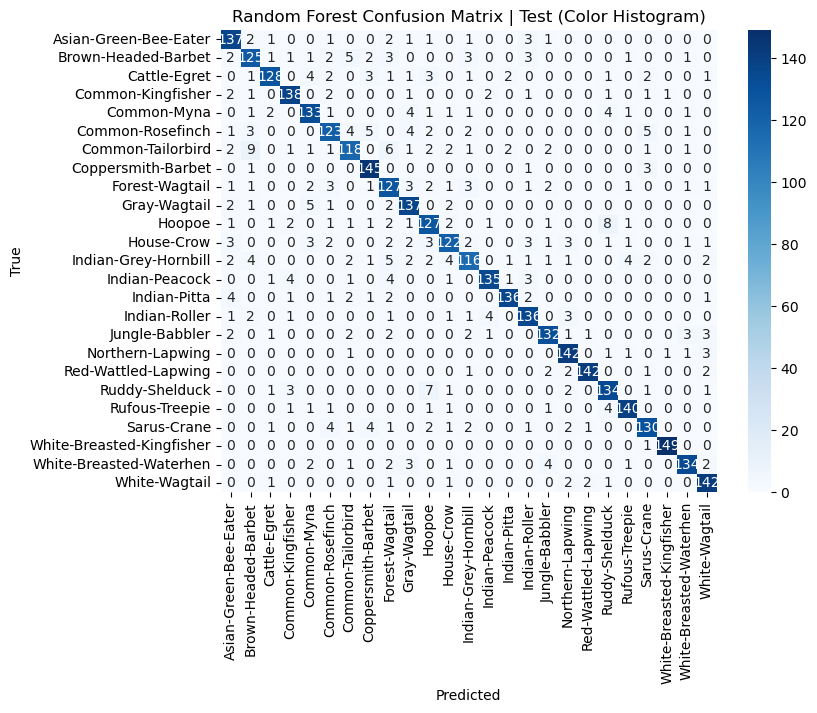

In [126]:
print("Random Forest | Test (Color Histogram) - Metrics:\n")
display_metrics(rf_color_hist_test_report)
plot_confusion_matrix(test_labels, rf_color_hist_test_preds, class_names, title="Random Forest Confusion Matrix | Test (Color Histogram)")

#### SIFT + BoW

In [124]:
# SVM

svm_sift_hist_test_preds, svm_sift_hist_test_report = train_evaluate_svm(
    train_sift_hist, train_labels, test_sift_hist, test_labels, class_names
)

SVM | Test (SIFT) - Metrics:

 Accuracy  Precision  Recall  F1-score
   0.2669     0.2709  0.2669    0.2666


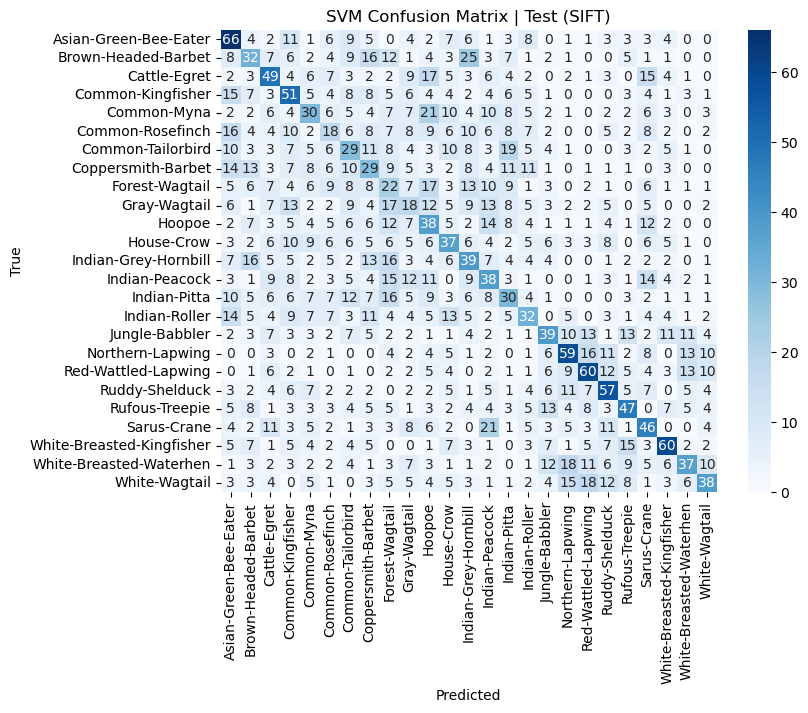

In [127]:
print("SVM | Test (SIFT) - Metrics:\n")
display_metrics(svm_sift_hist_test_report)
plot_confusion_matrix(test_labels, svm_sift_hist_test_preds, class_names, title="SVM Confusion Matrix | Test (SIFT)")

#### HoG

In [128]:
# SVM

svm_hog_test_preds, svm_hog_test_report = train_evaluate_svm(
    train_hog_feat, train_labels, test_hog_feat, test_labels, class_names
)


SVM | Test (HOG) - Metrics:

 Accuracy  Precision  Recall  F1-score
   0.3899     0.3912  0.3899    0.3886


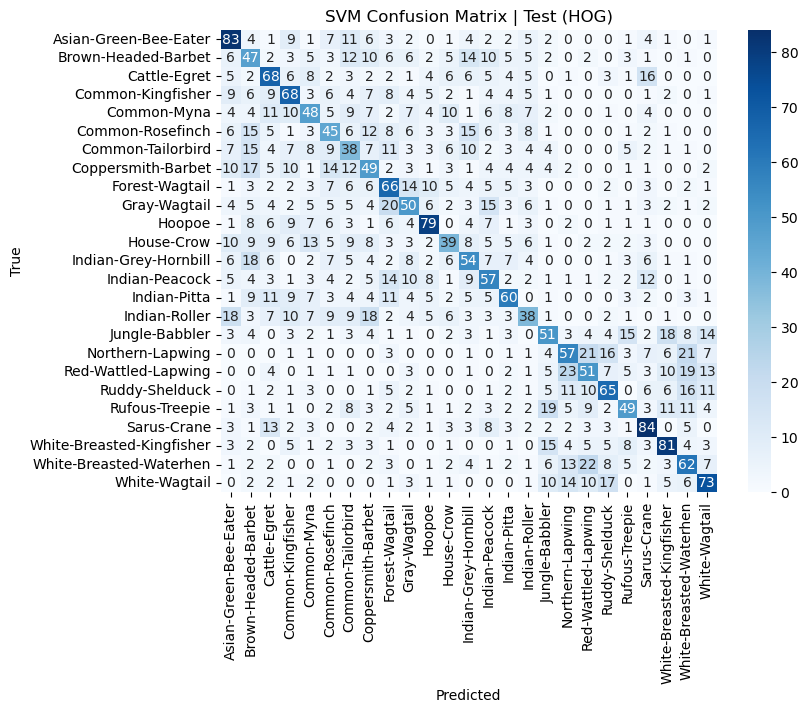

In [129]:
print("SVM | Test (HOG) - Metrics:\n")
display_metrics(svm_hog_test_report)
plot_confusion_matrix(test_labels, svm_hog_test_preds, class_names, title="SVM Confusion Matrix | Test (HOG)")

#### Compare Valid and Test Accuracies

It can be seen that there is a little drop in test accuracy compared to the validation accuracy. This is an expected behaviour as the test set is seen by the first time from the model's perspective.

In [130]:
comparison_data = {
    "Feature Extractor": ["Color Histogram", "SIFT + BoW", "HoG"],
    "Best Model": ["Random Forest", "SVM", "SVM"],
    "Validation Accuracy": [
        rf_color_hist_report["accuracy"],   # Random Forest on Color Histogram (validation)
        svm_sift_hist_report["accuracy"],   # SVM on SIFT+BoW (validation)
        svm_hog_report["accuracy"],         # SVM on HoG (validation)
    ],
    "Test Accuracy": [
        rf_color_hist_test_report["accuracy"],   # Random Forest on Color Histogram (test)
        svm_sift_hist_test_report["accuracy"],   # SVM on SIFT+BoW (test)
        svm_hog_test_report["accuracy"],         # SVM on HoG (test)
    ]
}

df_comparison = pd.DataFrame(comparison_data)
df_comparison = df_comparison.round(4)
print("Validation vs Test Accuracies for Best Models:")
df_comparison

Validation vs Test Accuracies for Best Models:


,Feature Extractor,Best Model,Validation Accuracy,Test Accuracy
0,Color Histogram,Random Forest,0.8901,0.8875
1,SIFT + BoW,SVM,0.2928,0.2669
2,HoG,SVM,0.4027,0.3899


## Part 3: Fine-Tuning Pretrained CNN Models

In Part 3, we are using widely known CNN models and fine-tuning them on our dataset. We are now moved on to the deep learning section of the project, after using classical machine learning approaches in Part 1 and 2.

The CNN models chosen in this part are MobileNetV3, ShuffleNetV2 and EfficientNetB0. These models are selected as they are lightweight (since the training processes are done on a personal computer) yet still powerful. They are designed for being efficient while still having good performance which makes them ideal for resource-constrained environments. They all have been trained on large-scale datasets such as ImageNet.

A large dataset is usually needed to train a model from scratch and it uses significant computational resources. Pretrained models are already fairly effective at capturing features such as textures and edges. Using fine-tuning we can adapt to a task faster and using much smaller datasets.

The aim of this section to use these models' learned feature representations and adapt it into out dataset which is very small compared to datasets such as ImageNet.

### Train and Evaluation Functions

In [2]:
def train_transfer_model(train_dataset, val_dataset, class_names,
                      model_name='mobilenetv3',     # 'mobilenetv3', 'shufflenetv2', 'efficientnet_b0'
                      random_init=False,            # If True, use random weights instead of pretrained
                      optimizer_type='adam',        # 'adam' or 'sgd'
                      batch_size=32,
                      learning_rate=0.001,
                      num_epochs=30,
                      device='cuda',
                      use_scheduler=True,
                      step_size=10,
                      gamma=0.1):
    
    # Load model
    if model_name == 'mobilenetv3':
        from torchvision.models import MobileNet_V3_Small_Weights
        weights = None if random_init else MobileNet_V3_Small_Weights.DEFAULT
        model = models.mobilenet_v3_small(weights=weights)
        in_features = model.classifier[3].in_features
        model.classifier[3] = nn.Linear(in_features, len(class_names))

    elif model_name == 'shufflenetv2':
        from torchvision.models import ShuffleNet_V2_X1_0_Weights
        weights = None if random_init else ShuffleNet_V2_X1_0_Weights.DEFAULT
        model = models.shufflenet_v2_x1_0(weights=weights)
        in_features = model.fc.in_features
        model.fc = nn.Linear(in_features, len(class_names))

    elif model_name == 'efficientnet_b0':
        from torchvision.models import EfficientNet_B0_Weights
        weights = None if random_init else EfficientNet_B0_Weights.DEFAULT
        model = models.efficientnet_b0(weights=weights)
        in_features = model.classifier[1].in_features
        model.classifier[1] = nn.Linear(in_features, len(class_names))

    else:
        raise ValueError(f"Unknown model name: {model_name}")
    
    # Move model to device
    model = model.to(device)

    # Data loaders
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, pin_memory=True, num_workers=4)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, pin_memory=True, num_workers=4)

    # Optimizer
    if optimizer_type.lower() == 'adam':
        optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    elif optimizer_type.lower() == 'sgd':
        optimizer = optim.SGD(model.parameters(), lr=learning_rate, momentum=0.9)
    else:
        raise ValueError(f"Unsupported optimizer type: {optimizer_type}")
    
    scheduler = None
    if use_scheduler:
        scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=step_size, gamma=gamma)

    criterion = nn.CrossEntropyLoss()

    train_losses = []
    val_accuracies = []
    train_accuracies = []

    best_val_acc = 0.0
    best_model = model.state_dict()

    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        correct = 0
        total = 0

        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

        train_acc = correct / total
        train_accuracies.append(train_acc)
        avg_train_loss = running_loss / len(train_loader)
        train_losses.append(avg_train_loss)

        # Validation
        model.eval()
        val_correct = 0
        val_total = 0
        with torch.no_grad():
            for images, labels in val_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                _, predicted = torch.max(outputs, 1)
                val_total += labels.size(0)
                val_correct += (predicted == labels).sum().item()

        val_acc = val_correct / val_total
        val_accuracies.append(val_acc)

        # Scheduler step
        if scheduler is not None:
            scheduler.step()

        # Save best model
        if val_acc > best_val_acc:
            best_val_acc = val_acc
            best_model = copy.deepcopy(model.state_dict())

        print(f"[{model_name.upper()} | {optimizer_type.upper()} | Random Init: {random_init}] "
              f"Epoch [{epoch+1}/{num_epochs}] | Train Acc: {train_acc:.4f} | Val Acc: {val_acc:.4f}")
        
    # Load best model weights
    model.load_state_dict(best_model)

    # Plotting
    fig, axs = plt.subplots(1, 2, figsize=(14, 5))
    fig.suptitle(f"{model_name.upper()} | Init: {'Random' if random_init else 'Pretrained'} | "
                 f"Opt: {optimizer_type.upper()} | Best Val Acc={best_val_acc:.4f}")

    axs[0].plot(train_losses, label="Train Loss", color='blue')
    axs[0].set_title("Training Loss Over Epochs")
    axs[0].set_xlabel("Epoch")
    axs[0].set_ylabel("Loss")
    axs[0].legend()

    axs[1].plot(val_accuracies, label="Validation Accuracy", color='red')
    axs[1].set_title("Validation Accuracy Over Epochs")
    axs[1].set_xlabel("Epoch")
    axs[1].set_ylabel("Accuracy")
    axs[1].legend()

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

    return {
        "model": model,
        "train_losses": train_losses,
        "val_accuracies": val_accuracies,
        "train_accuracies": train_accuracies
    }

In [12]:
def evaluate_model(model, test_dataset, class_names, batch_size=128, device='cuda'):
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)
    model.eval()
    model.to(device)

    correct = 0
    total = 0
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for images, labels in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
            all_preds.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    report = classification_report(all_labels, all_preds, target_names=class_names, output_dict=True)

    return all_labels, all_preds, report

### Dataset Preparation

The whole dataset is used while training the CNN models in Part 3, 4 and 5. They are resized to 128x128 and augmented with "RandomResizedCrop" and "RandomHorizontalFlip". Further data augmentation could not be done as it raised the computational cost.

In [8]:
# Check for GPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

train_transform = transforms.Compose([
    transforms.RandomResizedCrop(128, scale=(0.8, 1.0), ratio=(0.9, 1.1)),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5]*3, std=[0.5]*3)
])

val_test_transform = transforms.Compose([
    transforms.Resize((128, 128)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5]*3, std=[0.5]*3)
])

# Dataset path
dataset_root = "dataset"

# Load datasets
train_dataset = ImageFolder(os.path.join(dataset_root, "train"), transform=train_transform)
val_dataset = ImageFolder(os.path.join(dataset_root, "valid"), transform=val_test_transform)
test_dataset = ImageFolder(os.path.join(dataset_root, "test"), transform=val_test_transform)

# Print number of samples per set
print(f"Train samples: {len(train_dataset)}")
print(f"Validation samples: {len(val_dataset)}")
print(f"Test samples: {len(test_dataset)}")

# Class names
class_names = train_dataset.classes
print(f"Classes: {class_names}")

Using device: cuda
Train samples: 30000
Validation samples: 3750
Test samples: 3750
Classes: ['Asian-Green-Bee-Eater', 'Brown-Headed-Barbet', 'Cattle-Egret', 'Common-Kingfisher', 'Common-Myna', 'Common-Rosefinch', 'Common-Tailorbird', 'Coppersmith-Barbet', 'Forest-Wagtail', 'Gray-Wagtail', 'Hoopoe', 'House-Crow', 'Indian-Grey-Hornbill', 'Indian-Peacock', 'Indian-Pitta', 'Indian-Roller', 'Jungle-Babbler', 'Northern-Lapwing', 'Red-Wattled-Lapwing', 'Ruddy-Shelduck', 'Rufous-Treepie', 'Sarus-Crane', 'White-Breasted-Kingfisher', 'White-Breasted-Waterhen', 'White-Wagtail']


### Fine-tune the Models

The models are trained with adam optimizer, learning rate of 0.001 with a scheduler (step size of 10 and gamma of 0.1), batch size of 128 and for 30 epochs. These settings are used with all of the models in Part 3 and Part 4 for fair comparison and they are chosen with following an industry standard while considering hardware constraints in mind.

The models were not stopped, instead after 30 epochs, the model that gave the best validation accuracy is returned.

#### MobileNetV3

By looking at the graph and the epoch outputs, we can see that MobileNetV3 nearly learnt all of the training data while still having a good validation accuracy (0.9520). It could've been benefitted from dropout or data augmentations as it would maybe keep it from overfitting.

[MOBILENETV3 | ADAM | Random Init: False] Epoch [1/30] | Train Acc: 0.7957 | Val Acc: 0.8005
[MOBILENETV3 | ADAM | Random Init: False] Epoch [2/30] | Train Acc: 0.9254 | Val Acc: 0.8765
[MOBILENETV3 | ADAM | Random Init: False] Epoch [3/30] | Train Acc: 0.9503 | Val Acc: 0.8715
[MOBILENETV3 | ADAM | Random Init: False] Epoch [4/30] | Train Acc: 0.9637 | Val Acc: 0.8901
[MOBILENETV3 | ADAM | Random Init: False] Epoch [5/30] | Train Acc: 0.9693 | Val Acc: 0.8912
[MOBILENETV3 | ADAM | Random Init: False] Epoch [6/30] | Train Acc: 0.9758 | Val Acc: 0.8709
[MOBILENETV3 | ADAM | Random Init: False] Epoch [7/30] | Train Acc: 0.9760 | Val Acc: 0.8955
[MOBILENETV3 | ADAM | Random Init: False] Epoch [8/30] | Train Acc: 0.9828 | Val Acc: 0.8861
[MOBILENETV3 | ADAM | Random Init: False] Epoch [9/30] | Train Acc: 0.9837 | Val Acc: 0.9096
[MOBILENETV3 | ADAM | Random Init: False] Epoch [10/30] | Train Acc: 0.9833 | Val Acc: 0.9120
[MOBILENETV3 | ADAM | Random Init: False] Epoch [11/30] | Train Acc: 

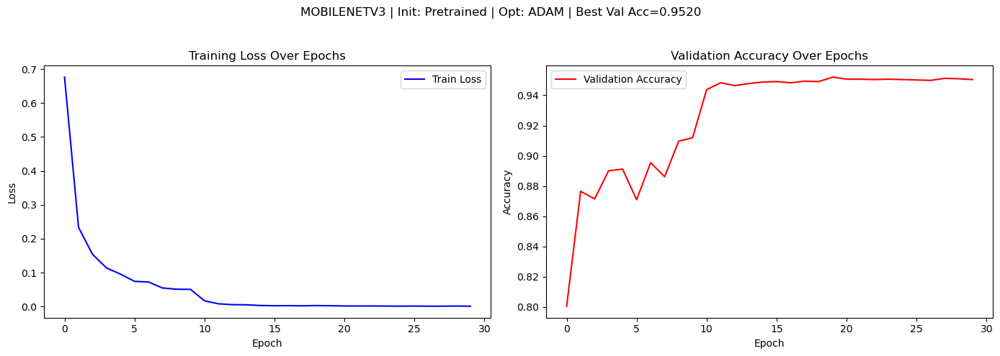

In [4]:
results_mobilenetv3_pretrained = train_transfer_model(
    train_dataset, val_dataset, class_names,
    model_name='mobilenetv3',
    random_init=False,
    optimizer_type='adam',
    batch_size=128,
    learning_rate=0.001,
    num_epochs=30,
    device=device,
    use_scheduler=True,
    step_size=10,
    gamma=0.1
)

#### ShuffleNetV2

By looking at the graphs and epoch outputs, we can see that the ShuffleNetV2 behaved similarly to MobileNetV3. It had 0.96 validation accuracy the best. The comments that are done for MobileNetV3 is relevant for this model as well.

[SHUFFLENETV2 | ADAM | Random Init: False] Epoch [1/30] | Train Acc: 0.7503 | Val Acc: 0.8752
[SHUFFLENETV2 | ADAM | Random Init: False] Epoch [2/30] | Train Acc: 0.9249 | Val Acc: 0.9024
[SHUFFLENETV2 | ADAM | Random Init: False] Epoch [3/30] | Train Acc: 0.9436 | Val Acc: 0.9195
[SHUFFLENETV2 | ADAM | Random Init: False] Epoch [4/30] | Train Acc: 0.9589 | Val Acc: 0.9208
[SHUFFLENETV2 | ADAM | Random Init: False] Epoch [5/30] | Train Acc: 0.9666 | Val Acc: 0.9144
[SHUFFLENETV2 | ADAM | Random Init: False] Epoch [6/30] | Train Acc: 0.9723 | Val Acc: 0.9195
[SHUFFLENETV2 | ADAM | Random Init: False] Epoch [7/30] | Train Acc: 0.9737 | Val Acc: 0.9256
[SHUFFLENETV2 | ADAM | Random Init: False] Epoch [8/30] | Train Acc: 0.9795 | Val Acc: 0.9240
[SHUFFLENETV2 | ADAM | Random Init: False] Epoch [9/30] | Train Acc: 0.9804 | Val Acc: 0.9299
[SHUFFLENETV2 | ADAM | Random Init: False] Epoch [10/30] | Train Acc: 0.9817 | Val Acc: 0.9280
[SHUFFLENETV2 | ADAM | Random Init: False] Epoch [11/30] | 

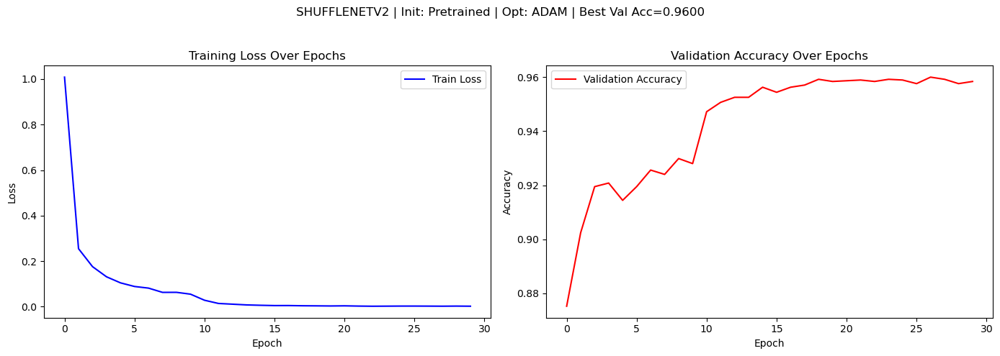

In [5]:
results_shufflenetv2_pretrained = train_transfer_model(
    train_dataset, val_dataset, class_names,
    model_name='shufflenetv2',
    random_init=False,
    optimizer_type='adam',
    batch_size=128,
    learning_rate=0.001,
    num_epochs=30,
    device=device,
    use_scheduler=True,
    step_size=10,
    gamma=0.1
)

#### EfficientNetB0

By looking at the graphs and epoch outputs, we see that EfficientNetB0 behaved similarly to MobileNetV3 and ShuffleNetV2 as it fit to the training data completely. The difference is that it had even better accuracy than both of the models (0.9840). This is natural as the EfficientNetB0 is almost twice as big compared to the other two models.

[EFFICIENTNET_B0 | ADAM | Random Init: False] Epoch [1/30] | Train Acc: 0.8665 | Val Acc: 0.9320
[EFFICIENTNET_B0 | ADAM | Random Init: False] Epoch [2/30] | Train Acc: 0.9542 | Val Acc: 0.9517
[EFFICIENTNET_B0 | ADAM | Random Init: False] Epoch [3/30] | Train Acc: 0.9689 | Val Acc: 0.9507
[EFFICIENTNET_B0 | ADAM | Random Init: False] Epoch [4/30] | Train Acc: 0.9753 | Val Acc: 0.9531
[EFFICIENTNET_B0 | ADAM | Random Init: False] Epoch [5/30] | Train Acc: 0.9789 | Val Acc: 0.9544
[EFFICIENTNET_B0 | ADAM | Random Init: False] Epoch [6/30] | Train Acc: 0.9799 | Val Acc: 0.9600
[EFFICIENTNET_B0 | ADAM | Random Init: False] Epoch [7/30] | Train Acc: 0.9834 | Val Acc: 0.9539
[EFFICIENTNET_B0 | ADAM | Random Init: False] Epoch [8/30] | Train Acc: 0.9841 | Val Acc: 0.9605
[EFFICIENTNET_B0 | ADAM | Random Init: False] Epoch [9/30] | Train Acc: 0.9849 | Val Acc: 0.9563
[EFFICIENTNET_B0 | ADAM | Random Init: False] Epoch [10/30] | Train Acc: 0.9870 | Val Acc: 0.9597
[EFFICIENTNET_B0 | ADAM | Ran

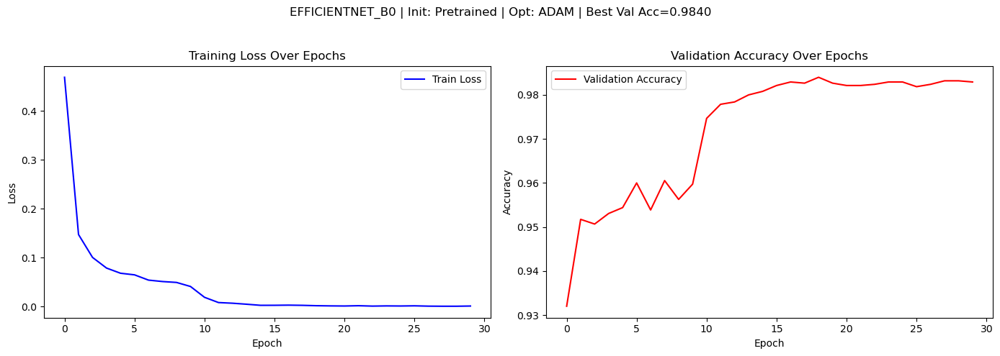

In [6]:
results_efficientnetb0_pretrained = train_transfer_model(
    train_dataset, val_dataset, class_names,
    model_name='efficientnet_b0',
    random_init=False,
    optimizer_type='adam',
    batch_size=128,
    learning_rate=0.001,
    num_epochs=30,
    device=device,
    use_scheduler=True,
    step_size=10,
    gamma=0.1
)

### Evaluation of the Models on Test Set

In this section, the models are evaluated on the test set.

In [ ]:
# MobileNetV3 Pretrained Evaluation

mobilenetv3_pretrained_labels, mobilenetv3_pretrained_preds, mobilenetv3_pretrained_report = evaluate_model(
    results_mobilenetv3_pretrained["model"], 
    test_dataset, 
    class_names, 
    batch_size=128, 
    device=device
)


In [17]:
print("MobileNetV3 Pretrained - Test Metrics:\n")
display_metrics(mobilenetv3_pretrained_report)

MobileNetV3 Pretrained - Test Metrics:

 Accuracy  Precision  Recall  F1-score
   0.9496      0.951  0.9496    0.9499


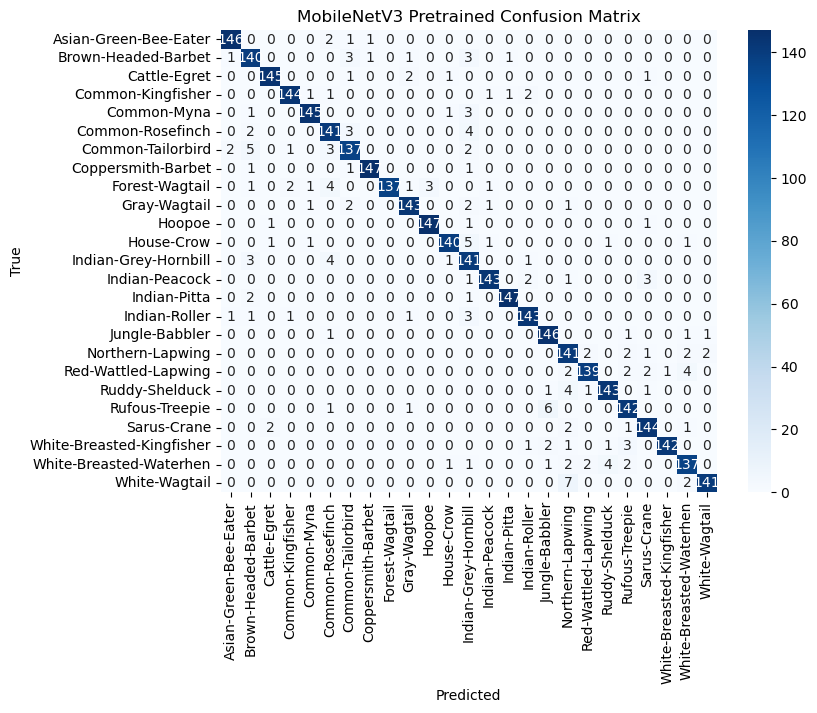

In [16]:
plot_confusion_matrix(
    mobilenetv3_pretrained_labels, 
    mobilenetv3_pretrained_preds, 
    class_names, 
    title="MobileNetV3 Pretrained Confusion Matrix"
)

In [19]:
# ShuffleNetV2 Pretrained Evaluation
shufflenetv2_pretrained_labels, shufflenetv2_pretrained_preds, shufflenetv2_pretrained_report = evaluate_model(
    results_shufflenetv2_pretrained["model"], 
    test_dataset, 
    class_names, 
    batch_size=128, 
    device=device
)


In [20]:
print("ShuffleNetV2 Pretrained - Test Metrics:\n")
display_metrics(shufflenetv2_pretrained_report)

ShuffleNetV2 Pretrained - Test Metrics:

 Accuracy  Precision  Recall  F1-score
   0.9539     0.9548  0.9539    0.9541


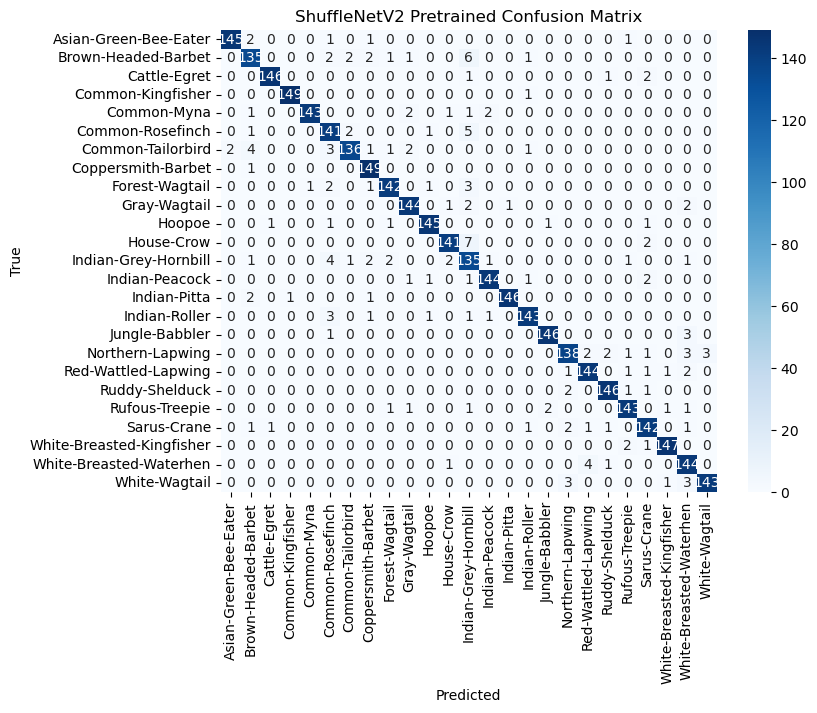

In [21]:
plot_confusion_matrix(
    shufflenetv2_pretrained_labels, 
    shufflenetv2_pretrained_preds, 
    class_names, 
    title="ShuffleNetV2 Pretrained Confusion Matrix"
)

In [22]:
# EfficientNetB0 Pretrained Evaluation
efficientnetb0_pretrained_labels, efficientnetb0_pretrained_preds, efficientnetb0_pretrained_report = evaluate_model(
    results_efficientnetb0_pretrained["model"], 
    test_dataset, 
    class_names, 
    batch_size=128, 
    device=device
)

In [23]:
print("EfficientNetB0 Pretrained - Test Metrics:\n")
display_metrics(efficientnetb0_pretrained_report)

EfficientNetB0 Pretrained - Test Metrics:

 Accuracy  Precision  Recall  F1-score
   0.9781     0.9784  0.9781    0.9781


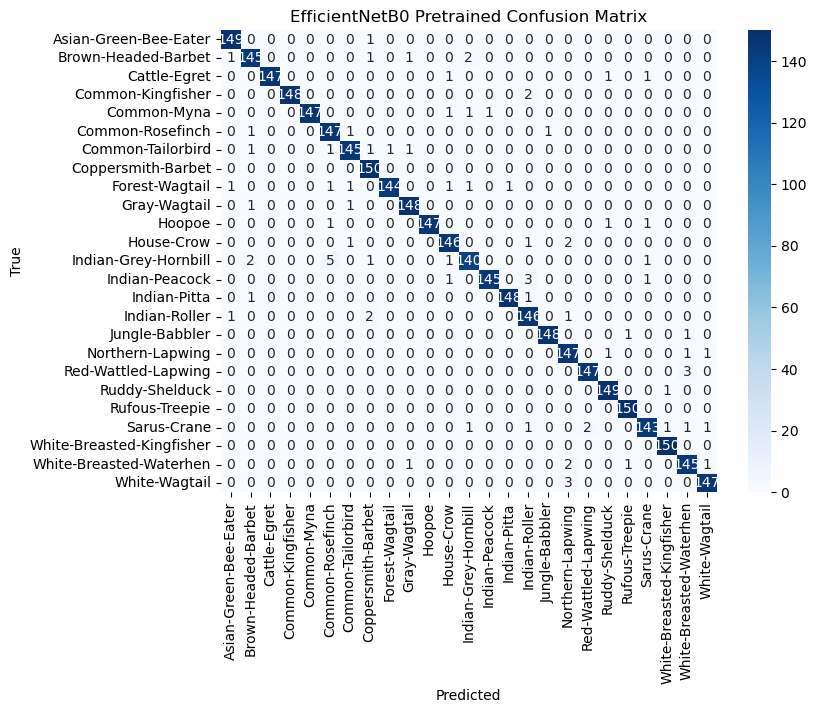

In [24]:
plot_confusion_matrix(
    efficientnetb0_pretrained_labels, 
    efficientnetb0_pretrained_preds, 
    class_names,
    title="EfficientNetB0 Pretrained Confusion Matrix"
)

### Results and Findings

The comments about the models are done in their respective titles under "Fine-tune the Models". EfficientNetB0 achieved the greatest test accuracy of 0.9781, while the MobileNetV3 and ShuffleNetV2 getting 0.9496 and 0.9539 respectively. This is expected as EfficientNetB0 is a larger and heavier model than the other two. As you can see, they performed a little lower on test sets, which is to be expected as that is a data the models see the first time.

In [25]:
pretrained_results = [
    {
        "Model": "MobileNetV3",
        "Val Accuracy": max(results_mobilenetv3_pretrained["val_accuracies"]),
        "Test Accuracy": mobilenetv3_pretrained_report["accuracy"]
    },
    {
        "Model": "ShuffleNetV2",
        "Val Accuracy": max(results_shufflenetv2_pretrained["val_accuracies"]),
        "Test Accuracy": shufflenetv2_pretrained_report["accuracy"]
    },
    {
        "Model": "EfficientNetB0",
        "Val Accuracy": max(results_efficientnetb0_pretrained["val_accuracies"]),
        "Test Accuracy": efficientnetb0_pretrained_report["accuracy"]
    }
]

df_pretrained_acc = pd.DataFrame(pretrained_results)
df_pretrained_acc = df_pretrained_acc.round(4)
print("Validation and Test Accuracies for Pretrained CNN Models:")
df_pretrained_acc

Validation and Test Accuracies for Pretrained CNN Models:


,Model,Val Accuracy,Test Accuracy
0,MobileNetV3,0.952,0.9496
1,ShuffleNetV2,0.960,0.9539
2,EfficientNetB0,0.984,0.9781


## Part 4: Training Randomly Weighted CNN Models

In Part 4, the models selected in Part 3 are initialized with random weights and only trained on our dataset. The same training configurations are used for fair comparison between Part 3 and Part 4.

The results and comparison with Part 3 is discussed under Results and Findings section. 

### Train the Randomly Weighted Models

The training configuration is the same with Part 3 except the use of scheduler. It is decided to not to use scheduler as we've expected the randomly weighted CNN models to not converge after 30 epochs. However our results showed that it could've benefitted from a scheduler as the validation accuracy stopped getting better after around 10 epoch for each model.

All three models behaved very similar while training, they started to overfit after 10 epochs. The training loss got lower and lower but the validation accuracy did not rise. This suggest that some methods that prevent overfitting such as dropout and data augmentation could be used here.

The same strategy of picking the best model regarding validation accuracy is used in this Part as well.

#### MobileNetV3

[MOBILENETV3 | ADAM | Random Init: True] Epoch [1/30] | Train Acc: 0.2396 | Val Acc: 0.0400
[MOBILENETV3 | ADAM | Random Init: True] Epoch [2/30] | Train Acc: 0.4609 | Val Acc: 0.1179
[MOBILENETV3 | ADAM | Random Init: True] Epoch [3/30] | Train Acc: 0.5817 | Val Acc: 0.5779
[MOBILENETV3 | ADAM | Random Init: True] Epoch [4/30] | Train Acc: 0.6536 | Val Acc: 0.6059
[MOBILENETV3 | ADAM | Random Init: True] Epoch [5/30] | Train Acc: 0.7045 | Val Acc: 0.6352
[MOBILENETV3 | ADAM | Random Init: True] Epoch [6/30] | Train Acc: 0.7381 | Val Acc: 0.6651
[MOBILENETV3 | ADAM | Random Init: True] Epoch [7/30] | Train Acc: 0.7692 | Val Acc: 0.7080
[MOBILENETV3 | ADAM | Random Init: True] Epoch [8/30] | Train Acc: 0.7965 | Val Acc: 0.7411
[MOBILENETV3 | ADAM | Random Init: True] Epoch [9/30] | Train Acc: 0.8105 | Val Acc: 0.7397
[MOBILENETV3 | ADAM | Random Init: True] Epoch [10/30] | Train Acc: 0.8306 | Val Acc: 0.7264
[MOBILENETV3 | ADAM | Random Init: True] Epoch [11/30] | Train Acc: 0.8471 | Va

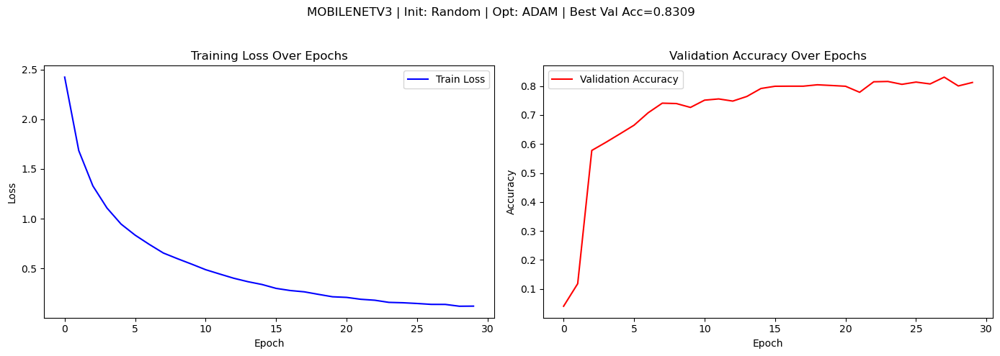

In [7]:
results_mobilenetv3_random_weights = train_transfer_model(
    train_dataset, val_dataset, class_names,
    model_name='mobilenetv3',
    random_init=True,
    optimizer_type='adam',
    batch_size=128,
    learning_rate=0.001,
    num_epochs=30,
    device=device,
    use_scheduler=False,
    step_size=10,
    gamma=0.1
)

#### ShuffleNetV2

[SHUFFLENETV2 | ADAM | Random Init: True] Epoch [1/30] | Train Acc: 0.1895 | Val Acc: 0.3251
[SHUFFLENETV2 | ADAM | Random Init: True] Epoch [2/30] | Train Acc: 0.3970 | Val Acc: 0.4477
[SHUFFLENETV2 | ADAM | Random Init: True] Epoch [3/30] | Train Acc: 0.5074 | Val Acc: 0.4875
[SHUFFLENETV2 | ADAM | Random Init: True] Epoch [4/30] | Train Acc: 0.5873 | Val Acc: 0.5485
[SHUFFLENETV2 | ADAM | Random Init: True] Epoch [5/30] | Train Acc: 0.6452 | Val Acc: 0.6272
[SHUFFLENETV2 | ADAM | Random Init: True] Epoch [6/30] | Train Acc: 0.7108 | Val Acc: 0.6373
[SHUFFLENETV2 | ADAM | Random Init: True] Epoch [7/30] | Train Acc: 0.7546 | Val Acc: 0.6813
[SHUFFLENETV2 | ADAM | Random Init: True] Epoch [8/30] | Train Acc: 0.7889 | Val Acc: 0.6915
[SHUFFLENETV2 | ADAM | Random Init: True] Epoch [9/30] | Train Acc: 0.8127 | Val Acc: 0.7280
[SHUFFLENETV2 | ADAM | Random Init: True] Epoch [10/30] | Train Acc: 0.8382 | Val Acc: 0.7643
[SHUFFLENETV2 | ADAM | Random Init: True] Epoch [11/30] | Train Acc: 

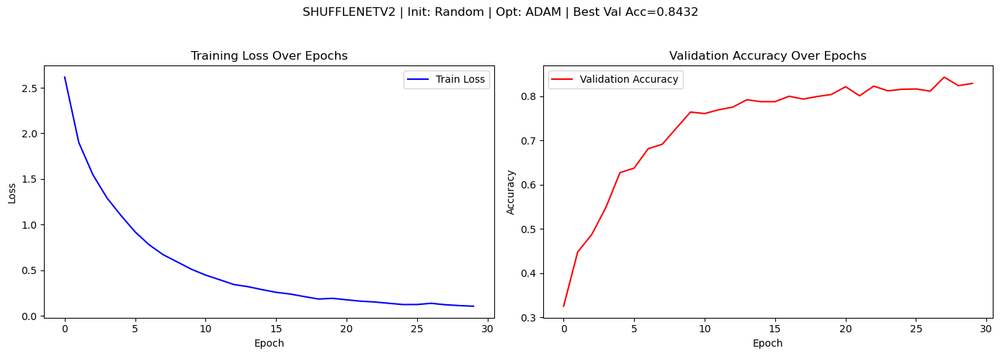

In [8]:
results_shufflenetv2_random_weights = train_transfer_model(
    train_dataset, val_dataset, class_names,
    model_name='shufflenetv2',
    random_init=True,
    optimizer_type='adam',
    batch_size=128,
    learning_rate=0.001,
    num_epochs=30,
    device=device,
    use_scheduler=False,
    step_size=10,
    gamma=0.1
)

#### EfficientNetB0

[EFFICIENTNET_B0 | ADAM | Random Init: True] Epoch [1/30] | Train Acc: 0.1593 | Val Acc: 0.1909
[EFFICIENTNET_B0 | ADAM | Random Init: True] Epoch [2/30] | Train Acc: 0.4036 | Val Acc: 0.4923
[EFFICIENTNET_B0 | ADAM | Random Init: True] Epoch [3/30] | Train Acc: 0.5922 | Val Acc: 0.6333
[EFFICIENTNET_B0 | ADAM | Random Init: True] Epoch [4/30] | Train Acc: 0.7024 | Val Acc: 0.7171
[EFFICIENTNET_B0 | ADAM | Random Init: True] Epoch [5/30] | Train Acc: 0.7554 | Val Acc: 0.7328
[EFFICIENTNET_B0 | ADAM | Random Init: True] Epoch [6/30] | Train Acc: 0.7996 | Val Acc: 0.7952
[EFFICIENTNET_B0 | ADAM | Random Init: True] Epoch [7/30] | Train Acc: 0.8264 | Val Acc: 0.8027
[EFFICIENTNET_B0 | ADAM | Random Init: True] Epoch [8/30] | Train Acc: 0.8364 | Val Acc: 0.8027
[EFFICIENTNET_B0 | ADAM | Random Init: True] Epoch [9/30] | Train Acc: 0.8626 | Val Acc: 0.8445
[EFFICIENTNET_B0 | ADAM | Random Init: True] Epoch [10/30] | Train Acc: 0.8807 | Val Acc: 0.8400
[EFFICIENTNET_B0 | ADAM | Random Init: 

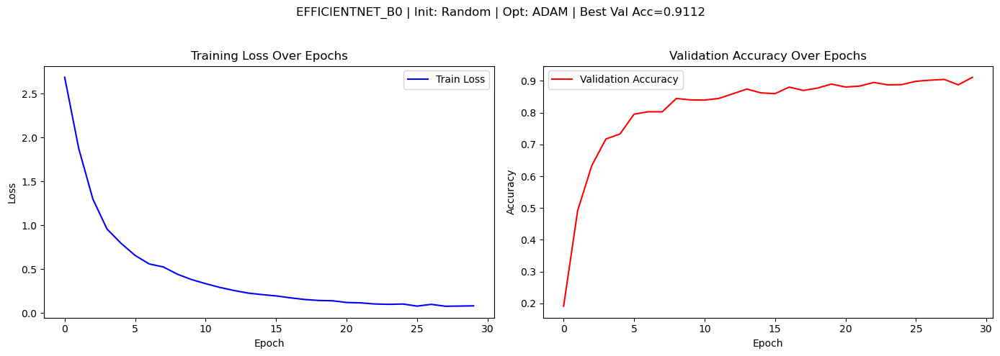

In [9]:
results_efficientnetb0_random_weights = train_transfer_model(
    train_dataset, val_dataset, class_names,
    model_name='efficientnet_b0',
    random_init=True,
    optimizer_type='adam',
    batch_size=128,
    learning_rate=0.001,
    num_epochs=30,
    device=device,
    use_scheduler=False,
    step_size=10,
    gamma=0.1
)

### Evaluation of the Models on Test Set

In this section, models are evaluated on the test set.

In [26]:
# MobileNetV3 Random Weights Evaluation

mobilenetv3_random_labels, mobilenetv3_random_preds, mobilenetv3_random_report = evaluate_model(
    results_mobilenetv3_random_weights["model"],
    test_dataset,
    class_names,
    batch_size=128,
    device=device
)

In [27]:
print("MobileNetV3 Random Weights - Test Metrics:\n")
display_metrics(mobilenetv3_random_report)

MobileNetV3 Random Weights - Test Metrics:

 Accuracy  Precision  Recall  F1-score
   0.8067     0.8145  0.8067    0.8078


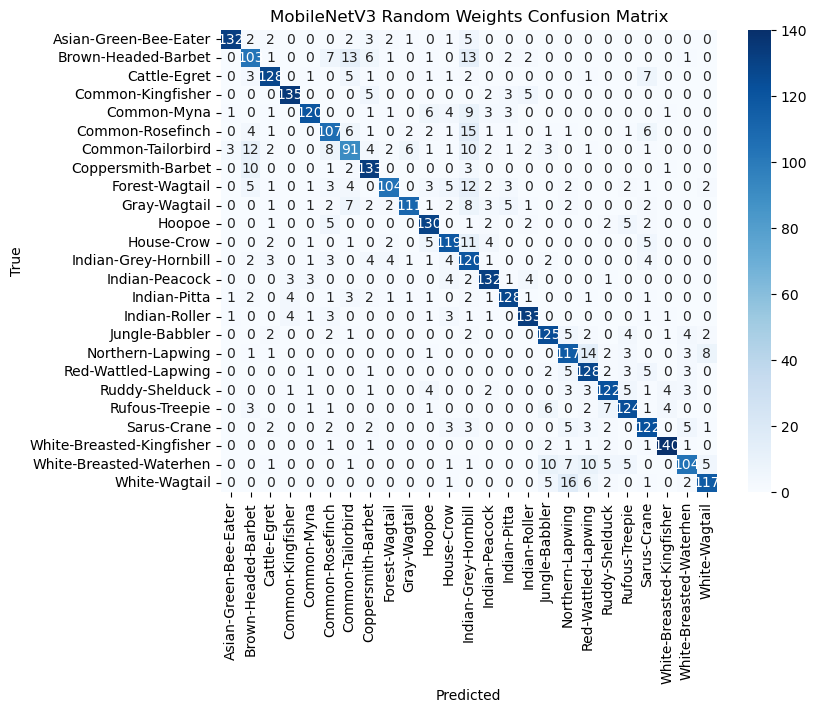

In [28]:
plot_confusion_matrix(
    mobilenetv3_random_labels,
    mobilenetv3_random_preds,
    class_names,
    title="MobileNetV3 Random Weights Confusion Matrix"
)

In [29]:
# ShuffleNetV2 Random Weights Evaluation

shufflenetv2_random_labels, shufflenetv2_random_preds, shufflenetv2_random_report = evaluate_model(
    results_shufflenetv2_random_weights["model"],
    test_dataset,
    class_names,
    batch_size=128,
    device=device
)

In [30]:
print("ShuffleNetV2 Random Weights - Test Metrics:\n")
display_metrics(shufflenetv2_random_report)

ShuffleNetV2 Random Weights - Test Metrics:

 Accuracy  Precision  Recall  F1-score
   0.8275     0.8344  0.8275    0.8289


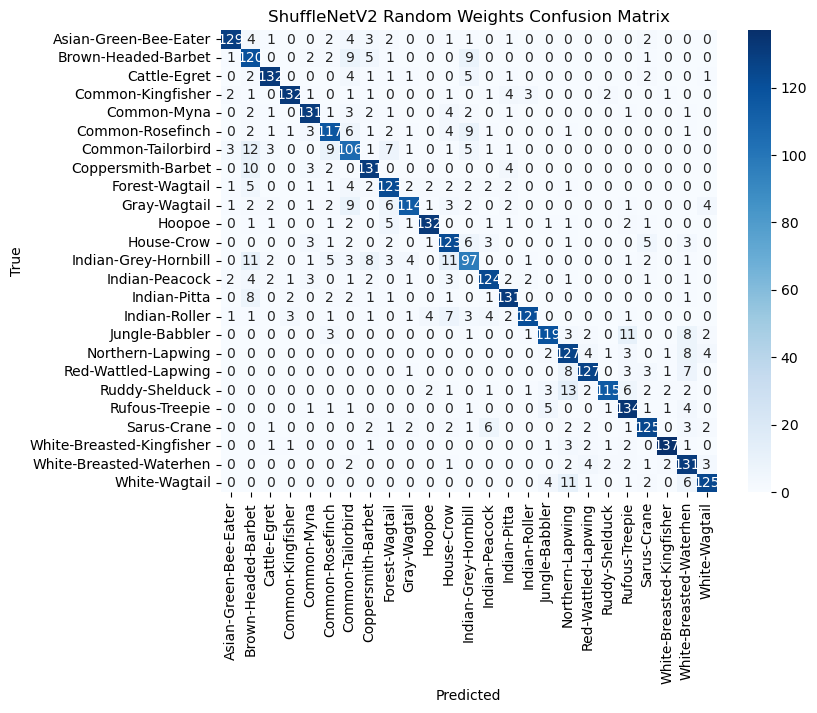

In [31]:
plot_confusion_matrix(
    shufflenetv2_random_labels,
    shufflenetv2_random_preds,
    class_names,
    title="ShuffleNetV2 Random Weights Confusion Matrix"
)

In [32]:
# EfficientNetB0 Random Weights Evaluation

efficientnetb0_random_labels, efficientnetb0_random_preds, efficientnetb0_random_report = evaluate_model(
    results_efficientnetb0_random_weights["model"],
    test_dataset,
    class_names,
    batch_size=128,
    device=device
)

In [33]:
print("EfficientNetB0 Random Weights - Test Metrics:\n")
display_metrics(efficientnetb0_random_report)

EfficientNetB0 Random Weights - Test Metrics:

 Accuracy  Precision  Recall  F1-score
   0.9101      0.913  0.9101    0.9104


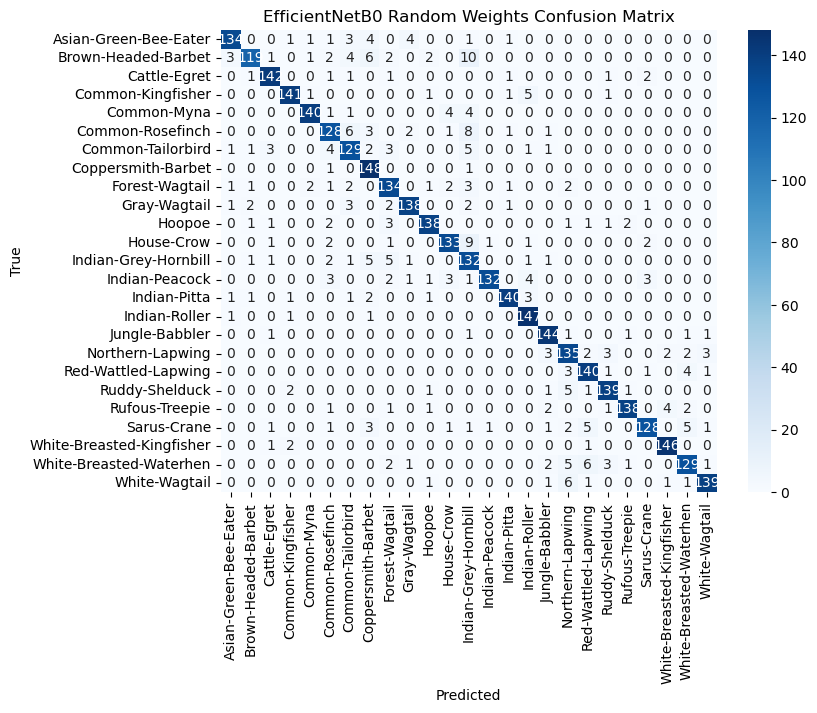

In [34]:
plot_confusion_matrix(
    efficientnetb0_random_labels,
    efficientnetb0_random_preds,
    class_names,
    title="EfficientNetB0 Random Weights Confusion Matrix"
)

### Validation and Test Accuracies Table

By looking at validation and test accuracies side by side, we can see that the test accuracies are a little bit lower. This is natural as the validation data is data that is seen before by the models.

In [35]:
random_results = [
    {
        "Model": "MobileNetV3",
        "Val Accuracy": max(results_mobilenetv3_random_weights["val_accuracies"]),
        "Test Accuracy": mobilenetv3_random_report["accuracy"]
    },
    {
        "Model": "ShuffleNetV2",
        "Val Accuracy": max(results_shufflenetv2_random_weights["val_accuracies"]),
        "Test Accuracy": shufflenetv2_random_report["accuracy"]
    },
    {
        "Model": "EfficientNetB0",
        "Val Accuracy": max(results_efficientnetb0_random_weights["val_accuracies"]),
        "Test Accuracy": efficientnetb0_random_report["accuracy"]
    }
]

df_random_acc = pd.DataFrame(random_results).round(4)
print("Validation and Test Accuracies for Randomly Initialized CNN Models:")
df_random_acc

Validation and Test Accuracies for Randomly Initialized CNN Models:


,Model,Val Accuracy,Test Accuracy
0,MobileNetV3,0.8309,0.8067
1,ShuffleNetV2,0.8432,0.8275
2,EfficientNetB0,0.9112,0.9101


### Results and Findings

By looking at the training processes of all the models, one thing that is consistent with all the pretrained and randomly weighted models is that the randomly weighted models tend to fit the training data more while still having relatively lower validation accuracies. This is an expected behaviour as our dataset is much smaller than the datasets these models are trained with. This results in overfitting which could be somewhat prevented by using dropout and more data augmentation. Also if we look at the results table, we can see that pretrained models performed better on test sets. These results highlight the importance of transfer learning while using small datasets.

In [37]:
comparison_table = pd.DataFrame({
    "Model": ["MobileNetV3", "ShuffleNetV2", "EfficientNetB0"],
    "Pretrained Test Accuracy": [
        mobilenetv3_pretrained_report["accuracy"],
        shufflenetv2_pretrained_report["accuracy"],
        efficientnetb0_pretrained_report["accuracy"]
    ],
    "Random Init Test Accuracy": [
        mobilenetv3_random_report["accuracy"],
        shufflenetv2_random_report["accuracy"],
        efficientnetb0_random_report["accuracy"]
    ]
}).round(4)

print("Test Accuracies: Pretrained vs Randomly Initialized CNN Models")
comparison_table

Test Accuracies: Pretrained vs Randomly Initialized CNN Models


,Model,Pretrained Test Accuracy,Random Init Test Accuracy
0,MobileNetV3,0.9496,0.8067
1,ShuffleNetV2,0.9539,0.8275
2,EfficientNetB0,0.9781,0.9101


## Part 5: Implementing and Training Your Own CNN Model from Scratch


In Part 5, we implemented three models from scratch with varying layer depths (3, 5, 7). The aim of this part is to test and compare our custom CNN models with pretrained ones from the Part 3 and 4. It also aims see the effect of the depth of the CNN in the image classification task.

The models are shortly explained in the CNN Models section and their training process are commented under Train CNN Models title. The results are discussed under Results and Findings section.

### Train and Evaluation Functions

In [3]:
def train_model(model_class, train_dataset, val_dataset, 
                num_classes=25, 
                input_size=(3, 128, 128), 
                dropout_rate=0.0,
                optimizer_type='adam',
                batch_size=32,
                learning_rate=0.001,
                num_epochs=30,
                device='cuda',
                use_scheduler=True,
                step_size=10,
                gamma=0.1,
                title="Model"):

    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, pin_memory=True, num_workers=4)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, pin_memory=True, num_workers=4)

    model = model_class(num_classes=num_classes, input_size=input_size, dropout_rate=dropout_rate).to(device)
    criterion = nn.CrossEntropyLoss()

    optimizer = optim.Adam(model.parameters(), lr=learning_rate) \
        if optimizer_type.lower() == 'adam' \
        else optim.SGD(model.parameters(), lr=learning_rate, momentum=0.9)

    scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=step_size, gamma=gamma) if use_scheduler else None

    best_model_weights = None
    best_val_acc = 0.0

    train_accuracies = []
    val_accuracies = []
    train_losses = []
    val_losses = []

    for epoch in range(num_epochs):
        # --- Training ---
        model.train()
        correct, total = 0, 0
        running_loss = 0.0

        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)

            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

        train_acc = correct / total
        train_accuracies.append(train_acc)
        train_losses.append(running_loss / len(train_loader))

        # --- Validation ---
        model.eval()
        correct, total = 0, 0
        val_loss = 0.0

        with torch.no_grad():
            for images, labels in val_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)
                val_loss += loss.item()
                _, predicted = torch.max(outputs, 1)
                total += labels.size(0)
                correct += (predicted == labels).sum().item()

        val_acc = correct / total
        val_accuracies.append(val_acc)
        val_losses.append(val_loss / len(val_loader))

        if scheduler:
            scheduler.step()

        print(f"Epoch [{epoch+1}/{num_epochs}] - Train Acc: {train_acc:.4f} - Val Acc: {val_acc:.4f}")

        if val_acc > best_val_acc:
            best_val_acc = val_acc
            best_model_weights = model.state_dict()

    # Restore best model weights
    model.load_state_dict(best_model_weights)

    # --- Plotting ---
    fig, axs = plt.subplots(1, 2, figsize=(14, 5))
    fig.suptitle(f"{title} | Final Val Acc:={val_accuracies[-1]:.4f}")

    # Loss plot
    axs[0].plot(train_losses, label="Train Loss", color='blue')
    axs[0].plot(val_losses, label="Val Loss", color='orange')
    axs[0].set_title("Loss Over Epochs")
    axs[0].set_xlabel("Epoch")
    axs[0].set_ylabel("Loss")
    axs[0].legend()

    # Accuracy plot
    axs[1].plot(train_accuracies, label="Train Accuracy", color='green')
    axs[1].plot(val_accuracies, label="Val Accuracy", color='red')
    axs[1].set_title("Accuracy Over Epochs")
    axs[1].set_xlabel("Epoch")
    axs[1].set_ylabel("Accuracy")
    axs[1].legend()

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

    return {
        "model": model,
        "train_accuracies": train_accuracies,
        "val_accuracies": val_accuracies,
        "best_val_acc": best_val_acc
    }


### CNN Models

In this section, three custom CNN models are implemented. They are named SmallCNN, MediumCNN and LargeCNN and respectively have 3, 5 and 7 convolutional layers. Here are some information about the structures used:

Each convolutional layer is followed with Batch Normalization and ReLU activation in all three of the models. Batch Normalization is used for normalizing the output of a layer to stabilize it. ReLU is used because it is fast, it introduces non-linearity into the model and helps avoiding the vanishing gradient problem. Max pooling with kernel 2 and stride 2 is used after certain layers to gradually reduce the size of an image.

Convolutional layers are chosen with kernel size 3, stride 1 and padding 1. Kernel size 3 is chosen because it captures local patterns effectively while also being computationally efficient. Stride 1 and padding 1 is chosen to keep the spatial size same. This way, downsampling is controlled explicitly by max pooling.

The models follow a standard CNN design pattern. As the spatial resolution decreases due to max pooling, channel depth increases to keep computational cost reasonable while increasing feature richness.


In [4]:
class SmallCNN(nn.Module):
    def __init__(self, num_classes=25, input_size=(3, 128, 128), dropout_rate=0.0):
        super(SmallCNN, self).__init__()

        self.features = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.MaxPool2d(2, 2),

            nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(2, 2),

            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.MaxPool2d(2, 2)
        )

        with torch.no_grad():
            dummy_input = torch.zeros(1, *input_size)
            dummy_output = self.features(dummy_input)
            flattened_size = dummy_output.view(1, -1).size(1)

        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Linear(flattened_size, 256),
            nn.ReLU(),
            nn.Dropout(dropout_rate),
            nn.Linear(256, num_classes)
        )

    def forward(self, x):
        x = self.features(x)
        x = self.classifier(x)
        return x

In [5]:
class MediumCNN(nn.Module):
    def __init__(self, num_classes=25, input_size=(3, 128, 128), dropout_rate=0.0):
        super(MediumCNN, self).__init__()

        self.features = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.MaxPool2d(2, 2),  # size / 2

            nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(2, 2),  # size / 2

            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.MaxPool2d(2, 2),  # size / 2

            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.MaxPool2d(2, 2),  # size / 2

            nn.Conv2d(256, 512, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU()
        )

        with torch.no_grad():
            dummy_input = torch.zeros(1, *input_size)
            dummy_output = self.features(dummy_input)
            flattened_size = dummy_output.view(1, -1).size(1)

        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Linear(flattened_size, 512),
            nn.ReLU(),
            nn.Dropout(dropout_rate),
            nn.Linear(512, num_classes)
        )

    def forward(self, x):
        x = self.features(x)
        x = self.classifier(x)
        return x


In [6]:
class LargeCNN(nn.Module):
    def __init__(self, num_classes=25, input_size=(3, 128, 128), dropout_rate=0.0):
        super(LargeCNN, self).__init__()

        self.features = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.MaxPool2d(2, 2),

            nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),

            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.MaxPool2d(2, 2),

            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),

            nn.Conv2d(256, 256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),

            nn.Conv2d(256, 512, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(),
            nn.MaxPool2d(2, 2),

            nn.Conv2d(512, 512, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU()
        )

        with torch.no_grad():
            dummy_input = torch.zeros(1, *input_size)
            dummy_output = self.features(dummy_input)
            flattened_size = dummy_output.view(1, -1).size(1)

        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Linear(flattened_size, 512),
            nn.ReLU(),
            nn.Dropout(dropout_rate),
            nn.Linear(512, num_classes)
        )

    def forward(self, x):
        x = self.features(x)
        x = self.classifier(x)
        return x

### Train CNN Models

The training settings are kept the same except the batch size. It is lowered to 64 because of hardware constraints (not enough VRAM). These settings are explained under Part 3.This way the comparisons that could be done with Part 3 and 4 would be fair.

#### SmallCNN

By looking at the graphs, we can see after ~12 epochs, the model started to overfit the data. However, it still achieved a great best validation accuracy ~0.76 while having 3 layers.

Epoch [1/30] - Train Acc: 0.2342 - Val Acc: 0.3645
Epoch [2/30] - Train Acc: 0.4512 - Val Acc: 0.4779
Epoch [3/30] - Train Acc: 0.5317 - Val Acc: 0.5115
Epoch [4/30] - Train Acc: 0.5863 - Val Acc: 0.5496
Epoch [5/30] - Train Acc: 0.6269 - Val Acc: 0.5333
Epoch [6/30] - Train Acc: 0.6686 - Val Acc: 0.6224
Epoch [7/30] - Train Acc: 0.6968 - Val Acc: 0.5411
Epoch [8/30] - Train Acc: 0.7296 - Val Acc: 0.6624
Epoch [9/30] - Train Acc: 0.7533 - Val Acc: 0.6835
Epoch [10/30] - Train Acc: 0.7755 - Val Acc: 0.7096
Epoch [11/30] - Train Acc: 0.8457 - Val Acc: 0.7357
Epoch [12/30] - Train Acc: 0.8607 - Val Acc: 0.7421
Epoch [13/30] - Train Acc: 0.8692 - Val Acc: 0.7397
Epoch [14/30] - Train Acc: 0.8756 - Val Acc: 0.7424
Epoch [15/30] - Train Acc: 0.8796 - Val Acc: 0.7493
Epoch [16/30] - Train Acc: 0.8862 - Val Acc: 0.7467
Epoch [17/30] - Train Acc: 0.8914 - Val Acc: 0.7525
Epoch [18/30] - Train Acc: 0.8955 - Val Acc: 0.7512
Epoch [19/30] - Train Acc: 0.8962 - Val Acc: 0.7600
Epoch [20/30] - Train

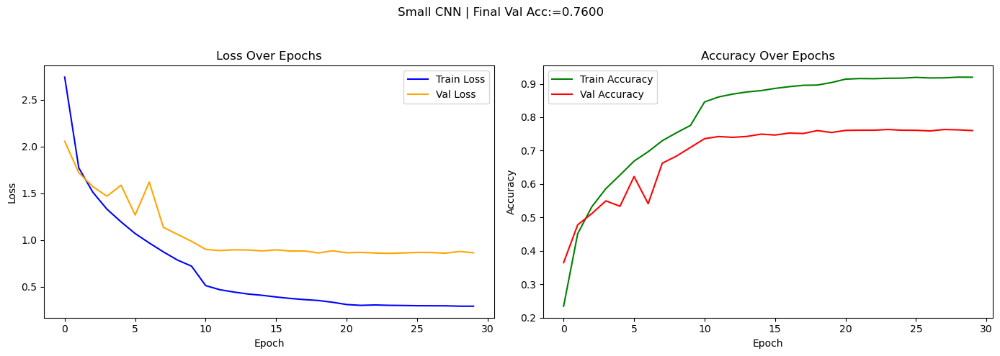

In [9]:
results_small_cnn = train_model(
    SmallCNN, train_dataset, val_dataset,
    num_classes=len(class_names),
    input_size=(3, 128, 128),
    dropout_rate=0.0,
    optimizer_type='adam',
    batch_size=64,
    learning_rate=0.001,
    num_epochs=30,
    device=device,
    use_scheduler=True,
    step_size=10,
    gamma=0.1,
    title="Small CNN"
)

#### MediumCNN

By looking at the graphs, we can see that similar to SmallCNN, it started to overfit after ~12 epochs. The difference is that it had way better best validation accuracy ~0.88. 

Epoch [1/30] - Train Acc: 0.0760 - Val Acc: 0.1104
Epoch [2/30] - Train Acc: 0.2271 - Val Acc: 0.2835
Epoch [3/30] - Train Acc: 0.3934 - Val Acc: 0.4509
Epoch [4/30] - Train Acc: 0.5509 - Val Acc: 0.5915
Epoch [5/30] - Train Acc: 0.6519 - Val Acc: 0.6664
Epoch [6/30] - Train Acc: 0.7185 - Val Acc: 0.6925
Epoch [7/30] - Train Acc: 0.7630 - Val Acc: 0.7211
Epoch [8/30] - Train Acc: 0.8026 - Val Acc: 0.7427
Epoch [9/30] - Train Acc: 0.8257 - Val Acc: 0.7184
Epoch [10/30] - Train Acc: 0.8544 - Val Acc: 0.7661
Epoch [11/30] - Train Acc: 0.9204 - Val Acc: 0.8536
Epoch [12/30] - Train Acc: 0.9338 - Val Acc: 0.8565
Epoch [13/30] - Train Acc: 0.9405 - Val Acc: 0.8653
Epoch [14/30] - Train Acc: 0.9474 - Val Acc: 0.8659
Epoch [15/30] - Train Acc: 0.9506 - Val Acc: 0.8685
Epoch [16/30] - Train Acc: 0.9574 - Val Acc: 0.8632
Epoch [17/30] - Train Acc: 0.9608 - Val Acc: 0.8683
Epoch [18/30] - Train Acc: 0.9649 - Val Acc: 0.8741
Epoch [19/30] - Train Acc: 0.9673 - Val Acc: 0.8717
Epoch [20/30] - Train

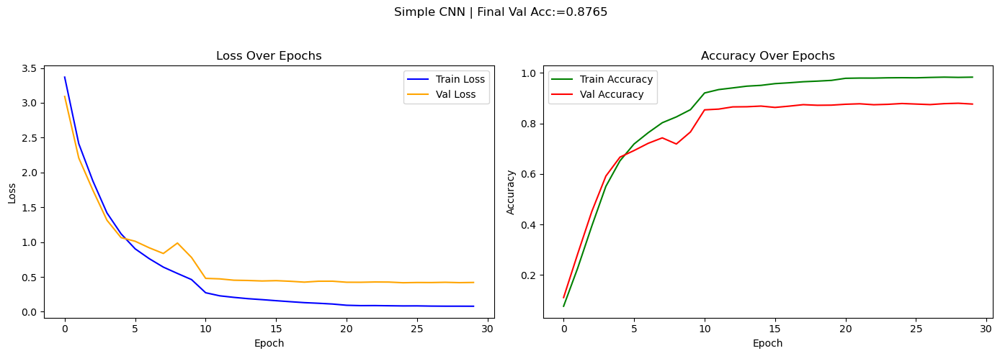

In [10]:
results_medium_cnn = train_model(
    MediumCNN, train_dataset, val_dataset,
    num_classes=len(class_names),
    input_size=(3, 128, 128),
    dropout_rate=0.0,
    optimizer_type='adam',
    batch_size=64,
    learning_rate=0.001,
    num_epochs=30,
    device=device,
    use_scheduler=True,
    step_size=10,
    gamma=0.1,
    title="Simple CNN"
)

#### LargeCNN

By looking at the graphs, we can see that LargeCNN is different than both of the other models. It did not overfit however it also did not achieve a good best validation score ~0.65 compared to other two. The reason for that is mostly related to the value of learning rate. We can see that it did not converge yet and it was still learning. Due to the scheduler used here, after 10 and 20 epochs, the learning rate even got lower. If we were to try the model with a bigger learning rate, we could've gotten better results. The most likely reason that it needs a bigger learning rate is that it is a little larger than the other models. Residual blocks can be implemented as well to keep the gradients from vanishing.

Epoch [1/30] - Train Acc: 0.0528 - Val Acc: 0.0643
Epoch [2/30] - Train Acc: 0.0790 - Val Acc: 0.0965
Epoch [3/30] - Train Acc: 0.1058 - Val Acc: 0.1179
Epoch [4/30] - Train Acc: 0.1105 - Val Acc: 0.1101
Epoch [5/30] - Train Acc: 0.1222 - Val Acc: 0.1224
Epoch [6/30] - Train Acc: 0.1392 - Val Acc: 0.1467
Epoch [7/30] - Train Acc: 0.1780 - Val Acc: 0.2123
Epoch [8/30] - Train Acc: 0.2144 - Val Acc: 0.2005
Epoch [9/30] - Train Acc: 0.2598 - Val Acc: 0.2888
Epoch [10/30] - Train Acc: 0.3512 - Val Acc: 0.3941
Epoch [11/30] - Train Acc: 0.4806 - Val Acc: 0.4859
Epoch [12/30] - Train Acc: 0.5116 - Val Acc: 0.5120
Epoch [13/30] - Train Acc: 0.5379 - Val Acc: 0.5245
Epoch [14/30] - Train Acc: 0.5578 - Val Acc: 0.5357
Epoch [15/30] - Train Acc: 0.5784 - Val Acc: 0.5509
Epoch [16/30] - Train Acc: 0.6021 - Val Acc: 0.5669
Epoch [17/30] - Train Acc: 0.6158 - Val Acc: 0.6027
Epoch [18/30] - Train Acc: 0.6371 - Val Acc: 0.6096
Epoch [19/30] - Train Acc: 0.6528 - Val Acc: 0.6235
Epoch [20/30] - Train

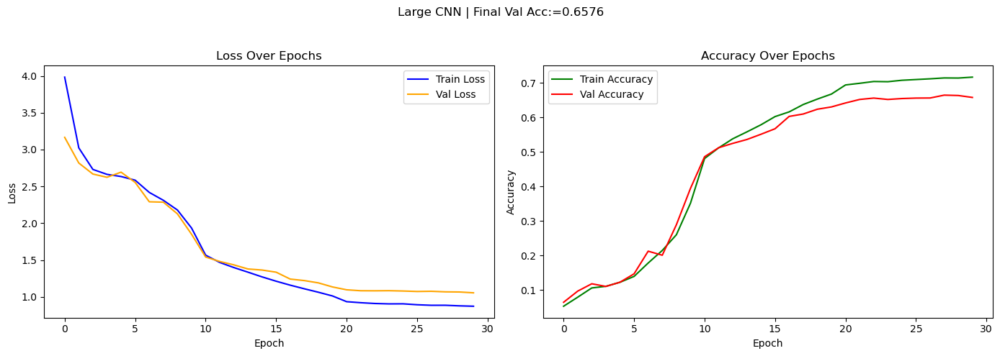

In [11]:
results_large_cnn = train_model(
    LargeCNN, train_dataset, val_dataset,
    num_classes=len(class_names),
    input_size=(3, 128, 128),
    dropout_rate=0.0,
    optimizer_type='adam',
    batch_size=64,
    learning_rate=0.001,
    num_epochs=30,
    device=device,
    use_scheduler=True,
    step_size=10,
    gamma=0.1,
    title="Large CNN"
)

### Evaluate CNN Models on Test Set

In [13]:
# Evaluate SmallCNN on Test Set

small_cnn_labels, small_cnn_preds, small_cnn_report = evaluate_model(
    results_small_cnn["model"],
    test_dataset,
    class_names,
    batch_size=64,
    device=device
)

In [14]:
print("SmallCNN - Test Metrics:\n")
display_metrics(small_cnn_report)

SmallCNN - Test Metrics:

 Accuracy  Precision  Recall  F1-score
   0.7424     0.7523  0.7424    0.7441


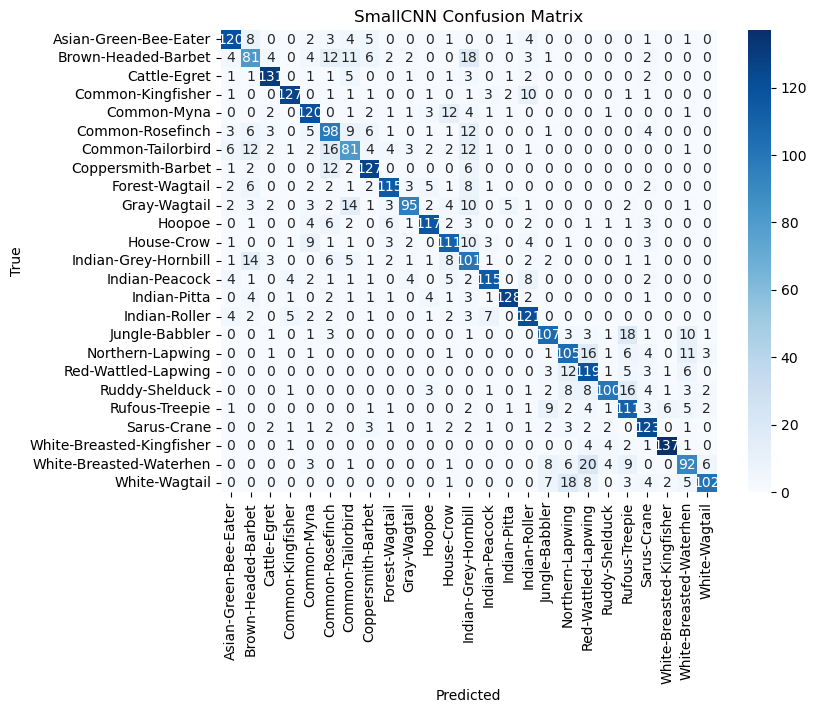

In [15]:
plot_confusion_matrix(small_cnn_labels, small_cnn_preds, class_names, title="SmallCNN Confusion Matrix")

In [16]:
# Evaluate MediumCNN on Test Set

medium_cnn_labels, medium_cnn_preds, medium_cnn_report = evaluate_model(
    results_medium_cnn["model"],
    test_dataset,
    class_names,
    batch_size=128,
    device=device
)


In [17]:
print("MediumCNN - Test Metrics:\n")
display_metrics(medium_cnn_report)

MediumCNN - Test Metrics:

 Accuracy  Precision  Recall  F1-score
   0.8589     0.8635  0.8589    0.8597


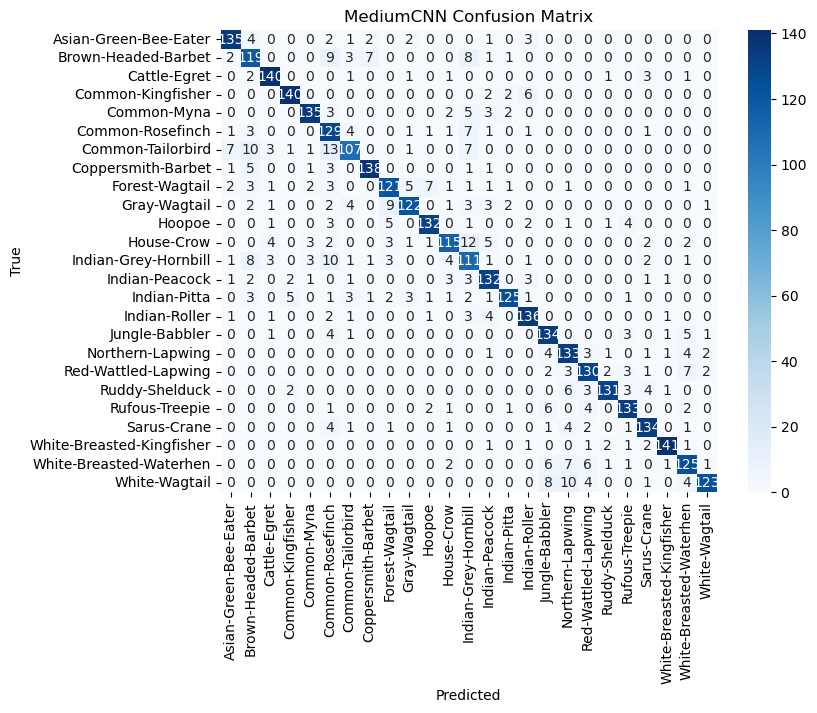

In [18]:
plot_confusion_matrix(medium_cnn_labels, medium_cnn_preds, class_names, title="MediumCNN Confusion Matrix")

In [19]:
# Evaluate LargeCNN on Test Set
large_cnn_labels, large_cnn_preds, large_cnn_report = evaluate_model(
    results_large_cnn["model"],
    test_dataset,
    class_names,
    batch_size=128,
    device=device
)

In [20]:
print("LargeCNN - Test Metrics:\n")
display_metrics(large_cnn_report)

LargeCNN - Test Metrics:

 Accuracy  Precision  Recall  F1-score
   0.6643     0.6729  0.6643    0.6652


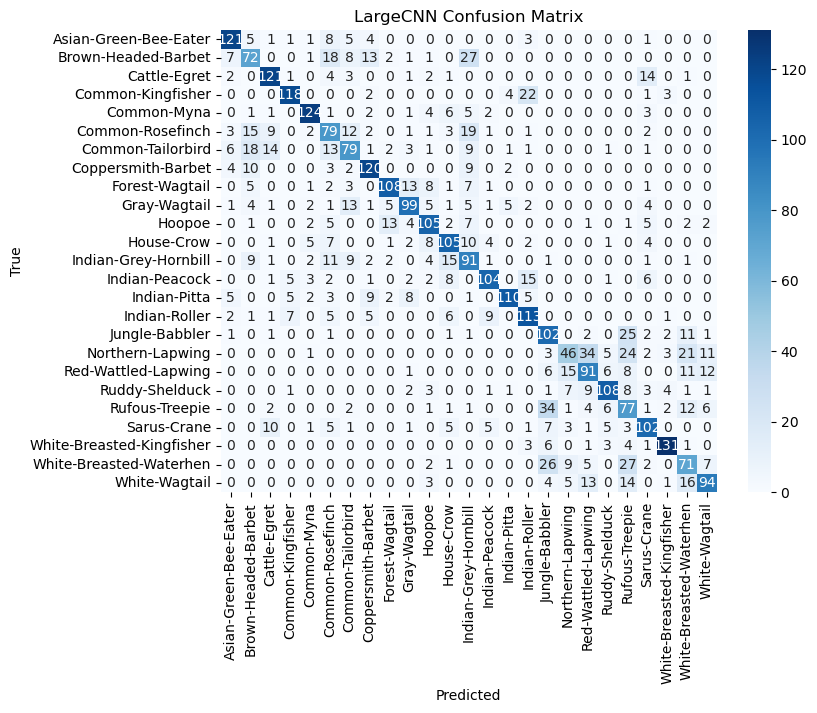

In [21]:
plot_confusion_matrix(large_cnn_labels, large_cnn_preds, class_names, title="LargeCNN Confusion Matrix")

### Results and Findings

The comments for training processes of each model can be found under Train CNN Models title under their respective sections.

When we look at the test accuracies, we can see that the most successful model is our MediumCNN with 0.8589 accuracy. The SmallCNN were not enough to capture the relations between the features and the LargeCNN should've had residual blocks to keep the gradients flowing. We can also see that it achieved better test results than randomly initialized MobileNetV3 and ShuffleNetV2, proving that it can be still effective to try to build our own model in some cases.

In [22]:
cnn_results = [
    {
        "Model": "SmallCNN",
        "Val Accuracy": max(results_small_cnn["val_accuracies"]),
        "Test Accuracy": small_cnn_report["accuracy"]
    },
    {
        "Model": "MediumCNN",
        "Val Accuracy": max(results_medium_cnn["val_accuracies"]),
        "Test Accuracy": medium_cnn_report["accuracy"]
    },
    {
        "Model": "LargeCNN",
        "Val Accuracy": max(results_large_cnn["val_accuracies"]),
        "Test Accuracy": large_cnn_report["accuracy"]
    }
]

df_cnn_acc = pd.DataFrame(cnn_results).round(4)
print("Validation and Test Accuracies for Custom CNN Models:")
df_cnn_acc

Validation and Test Accuracies for Custom CNN Models:


,Model,Val Accuracy,Test Accuracy
0,SmallCNN,0.7632,0.7424
1,MediumCNN,0.8797,0.8589
2,LargeCNN,0.6643,0.6643
